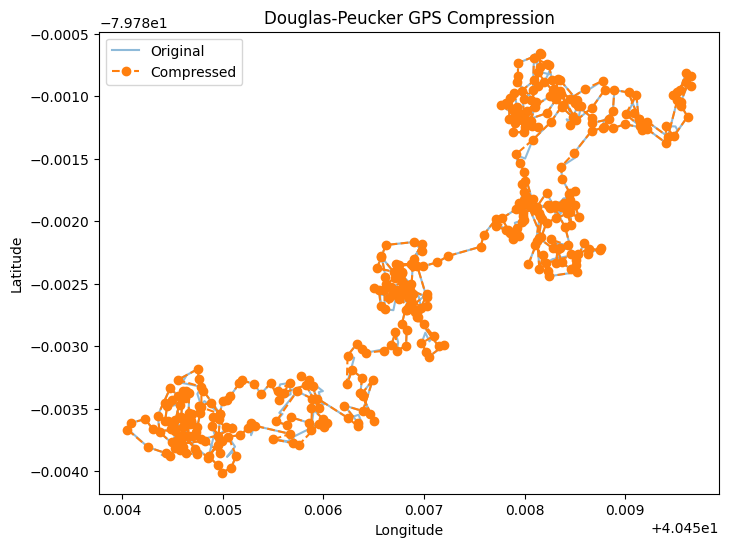

In [5]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.spatial import distance

# Load dataset
file_path = "simulated_uav_data.csv"
df = pd.read_csv(file_path)

# Extract GPS data
latitudes = df["latitudes"].values
longitudes = df["longitudes"].values

# Douglas-Peucker Algorithm
def douglas_peucker(points, epsilon):
    """ Simplifies a GPS trajectory using the Douglas-Peucker algorithm. """
    if len(points) < 3:
        return points

    # Find the point farthest from the line between start and end
    start, end = points[0], points[-1]
    dmax, index = max(
        (distance.euclidean(start, points[i]) if i != 0 and i != len(points) - 1 else 0, i)
        for i in range(len(points))
    )

    if dmax > epsilon:
        # Recursively simplify left and right segments
        left = douglas_peucker(points[:index + 1], epsilon)
        right = douglas_peucker(points[index:], epsilon)
        return np.vstack((left[:-1], right))
    else:
        return np.array([start, end])

# Apply Douglas-Peucker
gps_points = np.column_stack((latitudes, longitudes))
compressed_gps = douglas_peucker(gps_points, epsilon=0.0001)

# Plot Before & After
plt.figure(figsize=(8, 6))
plt.plot(longitudes, latitudes, label="Original", alpha=0.5)
plt.plot(compressed_gps[:, 1], compressed_gps[:, 0], label="Compressed", marker="o", linestyle="--")
plt.legend()
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Douglas-Peucker GPS Compression")
plt.show()


In [6]:
print(f"Original GPS Points: {len(gps_points)}")
print(f"Compressed GPS Points: {len(compressed_gps)}")
compression_ratio = (len(compressed_gps) / len(gps_points)) * 100
print(f"Compression Ratio: {compression_ratio:.2f}% of original data")


Original GPS Points: 500
Compressed GPS Points: 406
Compression Ratio: 81.20% of original data


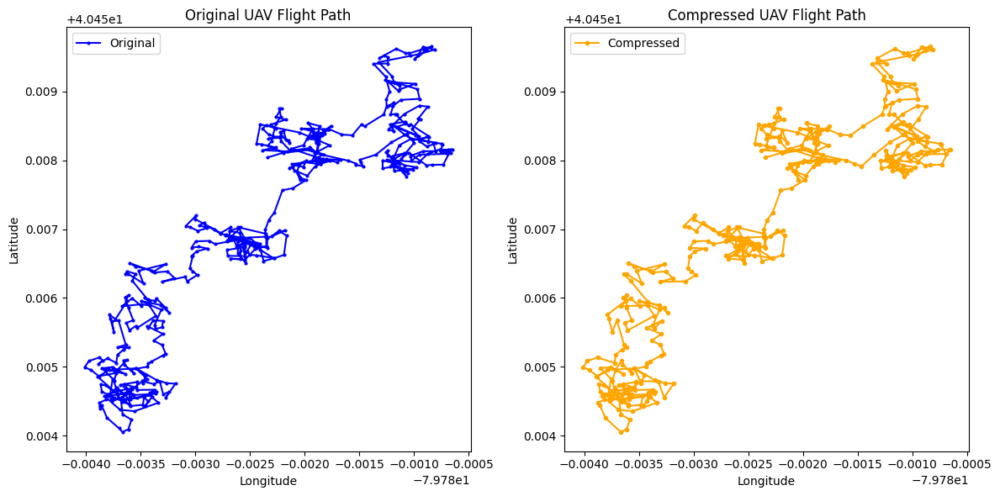

In [7]:
import matplotlib.pyplot as plt

# Assuming you have 'gps_points' (original) and 'compressed_gps' (after compression)
original_longitudes = [point[0] for point in gps_points]  # Extract longitude values
original_latitudes = [point[1] for point in gps_points]  # Extract latitude values

compressed_longitudes = [point[0] for point in compressed_gps]  # Compressed longitude values
compressed_latitudes = [point[1] for point in compressed_gps]  # Compressed latitude values

# Create two separate subplots
fig, axs = plt.subplots(1, 2, figsize=(12, 6))

# Plot Original GPS Data
axs[0].plot(original_longitudes, original_latitudes, color='blue', marker='o', markersize=2, linestyle='-', label="Original")
axs[0].set_title("Original UAV Flight Path")
axs[0].set_xlabel("Longitude")
axs[0].set_ylabel("Latitude")
axs[0].legend()

# Plot Compressed GPS Data
axs[1].plot(compressed_longitudes, compressed_latitudes, color='orange', marker='o', markersize=3, linestyle='-', label="Compressed")
axs[1].set_title("Compressed UAV Flight Path")
axs[1].set_xlabel("Longitude")
axs[1].set_ylabel("Latitude")
axs[1].legend()

# Show plots
plt.tight_layout()
plt.show()


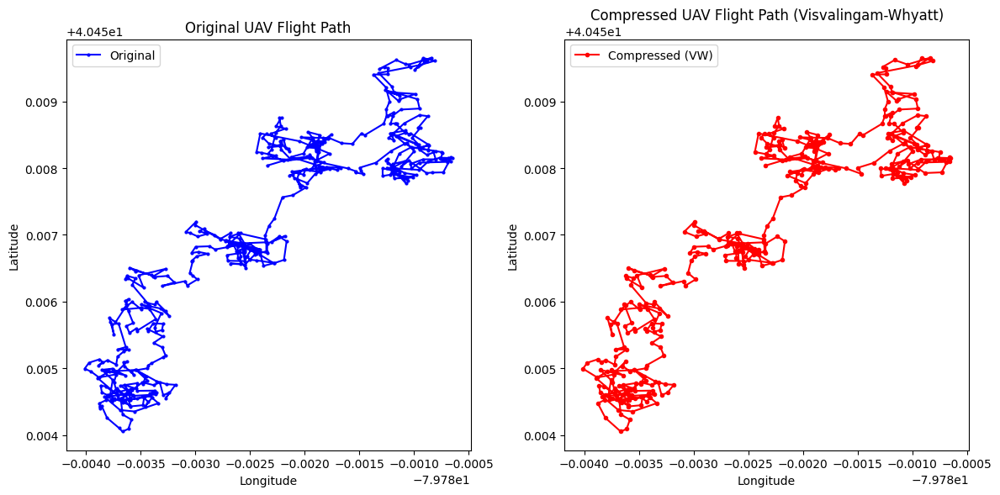

Original GPS Points: 500
Compressed GPS Points (Visvalingam-Whyatt): 400
Compression Ratio: 80.00% of original data


In [8]:
import numpy as np
import matplotlib.pyplot as plt

def calculate_area(p1, p2, p3):
    """Calculate the area of the triangle formed by three points."""
    return abs((p1[0] * (p2[1] - p3[1]) +
                p2[0] * (p3[1] - p1[1]) +
                p3[0] * (p1[1] - p2[1])) / 2.0)

def visvalingam_whyatt_simplify(points, num_points_to_keep):
    """Reduce the number of points using the Visvalingam-Whyatt algorithm."""
    points = [list(p) for p in points]  # Convert to mutable lists
    while len(points) > num_points_to_keep:
        # Compute triangle areas
        areas = [calculate_area(points[i-1], points[i], points[i+1]) for i in range(1, len(points)-1)]
        min_area_index = areas.index(min(areas)) + 1  # Find the smallest triangle
        del points[min_area_index]  # Remove the point forming the smallest triangle
    return np.array(points)

# Load original GPS points
original_gps = np.array(gps_points)  # Replace with actual original GPS data

# Apply Visvalingam-Whyatt compression (keeping ~80% of original points)
num_points_to_keep = int(len(original_gps) * 0.8)
compressed_gps_vw = visvalingam_whyatt_simplify(original_gps, num_points_to_keep)

# Extract coordinates
original_longitudes, original_latitudes = original_gps[:, 0], original_gps[:, 1]
compressed_longitudes_vw, compressed_latitudes_vw = compressed_gps_vw[:, 0], compressed_gps_vw[:, 1]

# Plot the results
fig, axs = plt.subplots(1, 2, figsize=(12, 6))

# Original GPS plot
axs[0].plot(original_longitudes, original_latitudes, 'bo-', markersize=2, label="Original")
axs[0].set_title("Original UAV Flight Path")
axs[0].set_xlabel("Longitude")
axs[0].set_ylabel("Latitude")
axs[0].legend()

# Compressed GPS plot (Visvalingam-Whyatt)
axs[1].plot(compressed_longitudes_vw, compressed_latitudes_vw, 'ro-', markersize=3, label="Compressed (VW)")
axs[1].set_title("Compressed UAV Flight Path (Visvalingam-Whyatt)")
axs[1].set_xlabel("Longitude")
axs[1].set_ylabel("Latitude")
axs[1].legend()

plt.tight_layout()
plt.show()

# Calculate Compression Ratio
compression_ratio_vw = len(compressed_gps_vw) / len(original_gps) * 100
print(f"Original GPS Points: {len(original_gps)}")
print(f"Compressed GPS Points (Visvalingam-Whyatt): {len(compressed_gps_vw)}")
print(f"Compression Ratio: {compression_ratio_vw:.2f}% of original data")


In [9]:
!pip install simplification


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 747.0/747.0 kB 29.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.4/16.4 MB 83.6 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 1.26.4
    Uninstalling numpy-1.26.4:
      Successfully uninstalled numpy-1.26.4
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
pytensor 2.27.1 requires numpy<2,>=1.17.0, but you have numpy 2.2.3 which is incompatible.
gensim 4.3.3 requires numpy<2.0,>=1.18.5, but you have numpy 2.2.3 which is incompatible.
thinc 8.2.5 requires numpy<2.0.0,>=1.19.0; python_version >= "3.9", but you have numpy 2.2.3 which is incompatible.
langchain 0.3.19 requires numpy<2,>=1.26.4; python_version < "3.12", but you have numpy 2.2.3 which is incompatible.
tensorflow 2.18.0 re

In [10]:
import numpy as np
import time
from simplification.cutil import simplify_coords_vw, simplify_coords

# Sample original GPS trajectory (lat, lon) - Replace with actual dataset
original_gps = np.random.rand(500, 2)  # Simulating 500 points for testing

# Test different tolerance levels
tolerances = [0.0005, 0.001, 0.005, 0.01]  # Adjust values as needed

print("Tolerance | DP Points | DP Time (s) | VW Points | VW Time (s)")
print("------------------------------------------------------------")

for tol in tolerances:
    # Douglas-Peucker
    start_time = time.time()
    dp_compressed_gps = simplify_coords(original_gps, tol)
    dp_time = time.time() - start_time
    dp_ratio = len(dp_compressed_gps) / len(original_gps) * 100

    # Visvalingam-Whyatt
    start_time = time.time()
    vw_compressed_gps = simplify_coords_vw(original_gps, tol)
    vw_time = time.time() - start_time
    vw_ratio = len(vw_compressed_gps) / len(original_gps) * 100

    print(f"{tol:.5f}  | {len(dp_compressed_gps):>8} | {dp_time:.5f} | {len(vw_compressed_gps):>8} | {vw_time:.5f}")



Tolerance | DP Points | DP Time (s) | VW Points | VW Time (s)
------------------------------------------------------------
0.00050  |      500 | 0.00056 |      499 | 0.00009
0.00100  |      500 | 0.00026 |      496 | 0.00005
0.00500  |      500 | 0.00050 |      478 | 0.00003
0.01000  |      498 | 0.00024 |      443 | 0.00003


In [11]:
import numpy as np
import time
from simplification.cutil import simplify_coords_vw, simplify_coords

# Sample original GPS trajectory (lat, lon) - Replace with actual dataset
original_gps = np.random.rand(500, 2)  # Simulating 500 points for testing

# Test different tolerance levels
tolerances = [0.0005, 0.001, 0.005, 0.01, 0.02, 0.05, 0.1]  # Higher values added

print("Tolerance | DP Points | DP Time (s) | VW Points | VW Time (s)")
print("------------------------------------------------------------")

for tol in tolerances:
    start_time = time.time()
    dp_compressed_gps = simplify_coords(original_gps, tol)
    dp_time = time.time() - start_time
    dp_ratio = len(dp_compressed_gps) / len(original_gps) * 100

    start_time = time.time()
    vw_compressed_gps = simplify_coords_vw(original_gps, tol)
    vw_time = time.time() - start_time
    vw_ratio = len(vw_compressed_gps) / len(original_gps) * 100

    print(f"{tol:.5f}  | {len(dp_compressed_gps):>8} | {dp_time:.5f} | {len(vw_compressed_gps):>8} | {vw_time:.5f}")


Tolerance | DP Points | DP Time (s) | VW Points | VW Time (s)
------------------------------------------------------------
0.00050  |      500 | 0.00031 |      497 | 0.00009
0.00100  |      500 | 0.00022 |      494 | 0.00002
0.00500  |      499 | 0.00020 |      470 | 0.00002
0.01000  |      496 | 0.00023 |      446 | 0.00003
0.02000  |      489 | 0.00020 |      385 | 0.00004
0.05000  |      471 | 0.00020 |      234 | 0.00007
0.10000  |      451 | 0.00019 |       91 | 0.00010


In [12]:
tolerances = [0.0005, 0.001, 0.005, 0.01, 0.02, 0.05, 0.1, 0.2, 0.5, 1.0]  # Higher values added

print("Tolerance | DP Points | DP Time (s) | VW Points | VW Time (s)")
print("------------------------------------------------------------")

for tol in tolerances:
    start_time = time.time()
    dp_compressed_gps = simplify_coords(original_gps, tol)
    dp_time = time.time() - start_time
    dp_ratio = len(dp_compressed_gps) / len(original_gps) * 100

    start_time = time.time()
    vw_compressed_gps = simplify_coords_vw(original_gps, tol)
    vw_time = time.time() - start_time
    vw_ratio = len(vw_compressed_gps) / len(original_gps) * 100

    print(f"{tol:.5f}  | {len(dp_compressed_gps):>8} | {dp_time:.5f} | {len(vw_compressed_gps):>8} | {vw_time:.5f}")


Tolerance | DP Points | DP Time (s) | VW Points | VW Time (s)
------------------------------------------------------------
0.00050  |      500 | 0.00035 |      497 | 0.00003
0.00100  |      500 | 0.00021 |      494 | 0.00002
0.00500  |      499 | 0.00020 |      470 | 0.00002
0.01000  |      496 | 0.00019 |      446 | 0.00007
0.02000  |      489 | 0.00020 |      385 | 0.00004
0.05000  |      471 | 0.00020 |      234 | 0.00007
0.10000  |      451 | 0.00019 |       91 | 0.00011
0.20000  |      392 | 0.00023 |        4 | 0.00014
0.50000  |      181 | 0.00014 |        2 | 0.00014
1.00000  |        3 | 0.00003 |        2 | 0.00014


In [13]:
!pip install rdp simplification


  Preparing metadata (setup.py) ... done
  Created wheel for rdp: filename=rdp-0.8-py3-none-any.whl size=4585 sha256=99d5e253fe40aa4c78aeb6608815fa48caa7e7f7201234b6d87d7a7c0f6b2728
  Stored in directory: /root/.cache/pip/wheels/40/25/67/b7065f31a9d5388f822ed08341da456e2dd047a1dbae2cf62a
Successfully built rdp


In [14]:
import simplification
print(simplification.__version__)


0.7.13


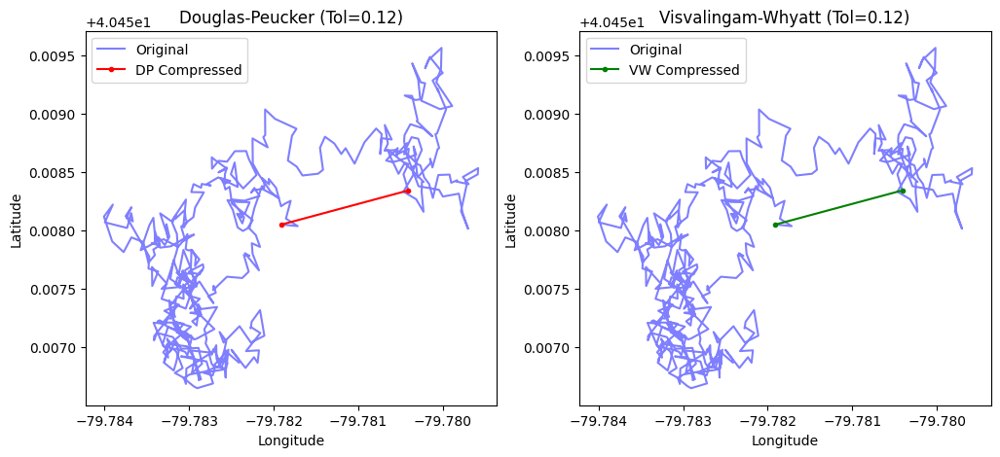

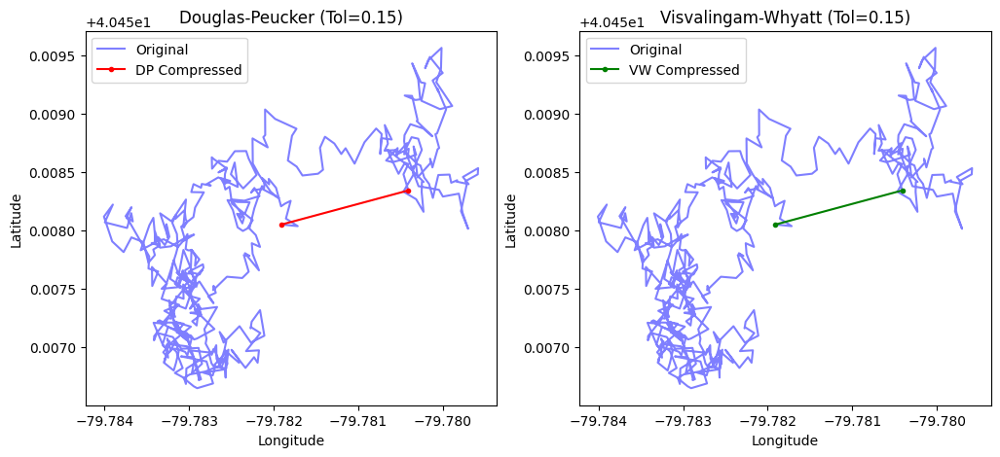

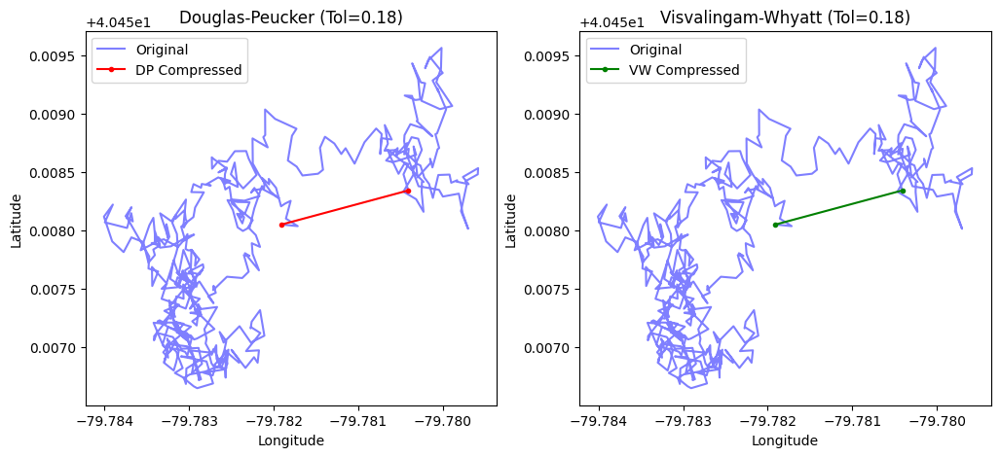

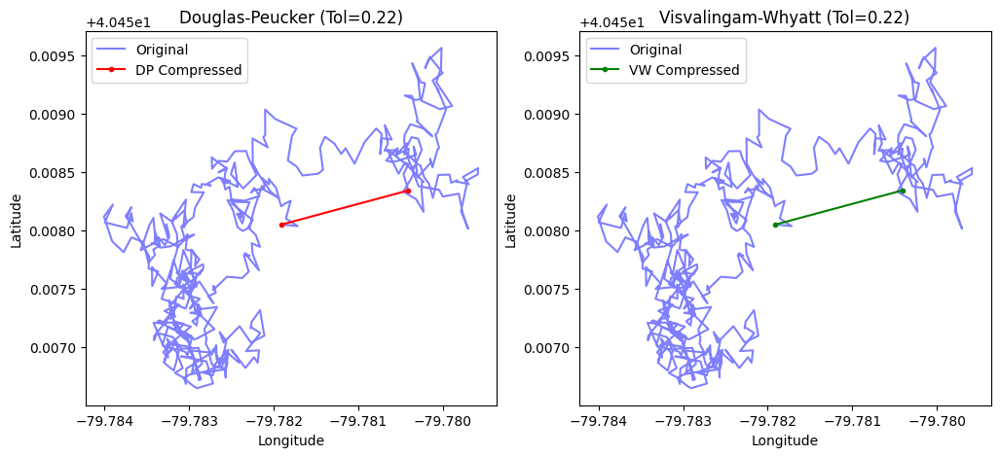

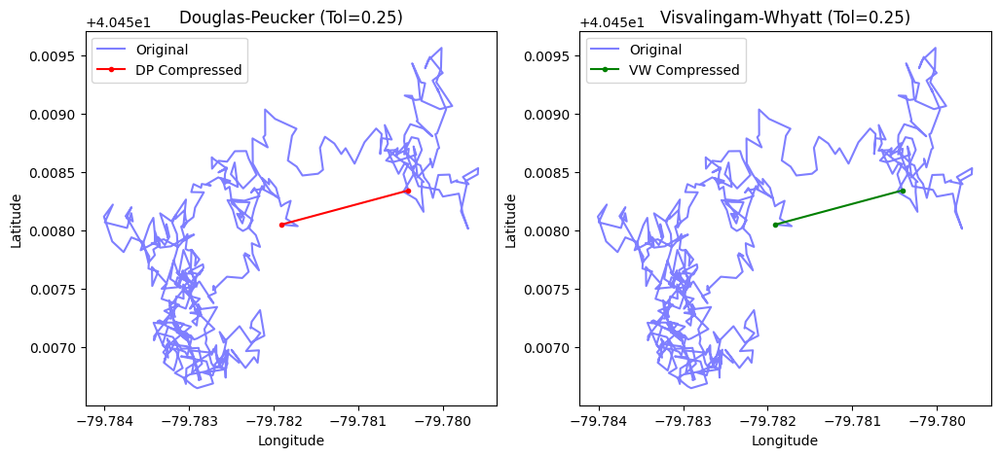

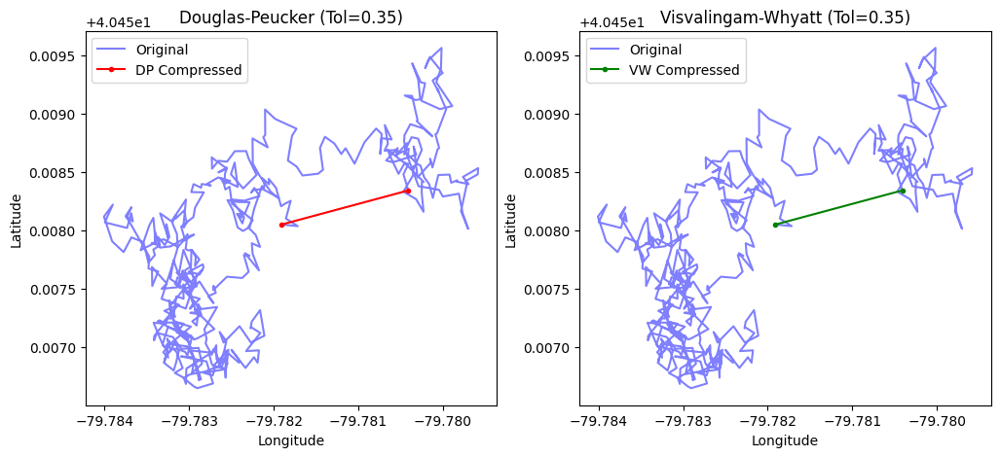

   Tolerance  DP Points  DP Time (s)  VW Points  VW Time (s)
0       0.12          2     0.052491          2     0.000808
1       0.15          2     0.072608          2     0.000758
2       0.18          2     0.091705          2     0.000735
3       0.22          2     0.144748          2     0.000817
4       0.25          2     0.064136          2     0.001005
5       0.35          2     0.039139          2     0.001008


In [15]:
!pip install simplification
import numpy as np
import matplotlib.pyplot as plt
from time import time
from rdp import rdp  # Douglas-Peucker
from simplification.cutil import simplify_coords_vw  # Import simplify_coords_vw directly

# Define Visvalingam-Whyatt wrapper function
def simplify_vw(points, tolerance):
    # Use simplify_coords_vw with the number of points to keep
    num_points_to_keep = int(len(points) * (1 - tolerance))  # Adjust as needed
    return simplify_coords_vw(np.array(points), num_points_to_keep)

# Sample Data (Replace with actual dataset)
np.random.seed(42)
latitudes = np.cumsum(np.random.randn(500) * 0.0001) + 40.458
longitudes = np.cumsum(np.random.randn(500) * 0.0001) - 79.782

original_data = np.column_stack((longitudes, latitudes))

# Intermediate tolerance values for finer testing
tolerance_values = [0.12, 0.15, 0.18, 0.22, 0.25, 0.35]

# Store results
results = []

# Run compression tests for both DP and VW
for tol in tolerance_values:
    # Douglas-Peucker
    start_dp = time()
    dp_compressed = rdp(original_data, epsilon=tol)
    dp_time = time() - start_dp
    dp_points = len(dp_compressed)

    # Visvalingam-Whyatt
    start_vw = time()
    vw_compressed = simplify_vw(original_data.tolist(), tol)
    vw_time = time() - start_vw
    vw_points = len(vw_compressed)

    results.append((tol, dp_points, dp_time, vw_points, vw_time))

    # Plot side by side for each tolerance
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))

    # Original Data
    axes[0].plot(original_data[:, 0], original_data[:, 1], 'b-', alpha=0.5, label="Original")
    axes[1].plot(original_data[:, 0], original_data[:, 1], 'b-', alpha=0.5, label="Original")

    # Douglas-Peucker
    axes[0].plot(dp_compressed[:, 0], dp_compressed[:, 1], 'ro-', markersize=3, label="DP Compressed")
    axes[0].set_title(f"Douglas-Peucker (Tol={tol})")
    axes[0].set_xlabel("Longitude")
    axes[0].set_ylabel("Latitude")
    axes[0].legend()

    # Visvalingam-Whyatt
    axes[1].plot(np.array(vw_compressed)[:, 0], np.array(vw_compressed)[:, 1], 'go-', markersize=3, label="VW Compressed")
    axes[1].set_title(f"Visvalingam-Whyatt (Tol={tol})")
    axes[1].set_xlabel("Longitude")
    axes[1].set_ylabel("Latitude")
    axes[1].legend()

    plt.show()

# Display results
import pandas as pd
df_results = pd.DataFrame(results, columns=["Tolerance", "DP Points", "DP Time (s)", "VW Points", "VW Time (s)"])
print(df_results)  # Print the table in the console
df_results.to_csv("compression_results.csv", index=False)  # Save to file for later use



In [16]:
df_results.to_csv("compression_results.csv", index=False)


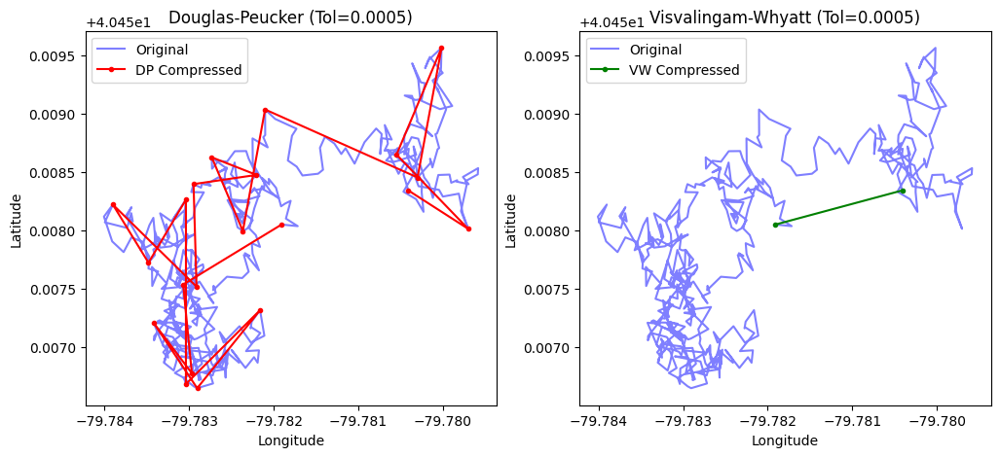

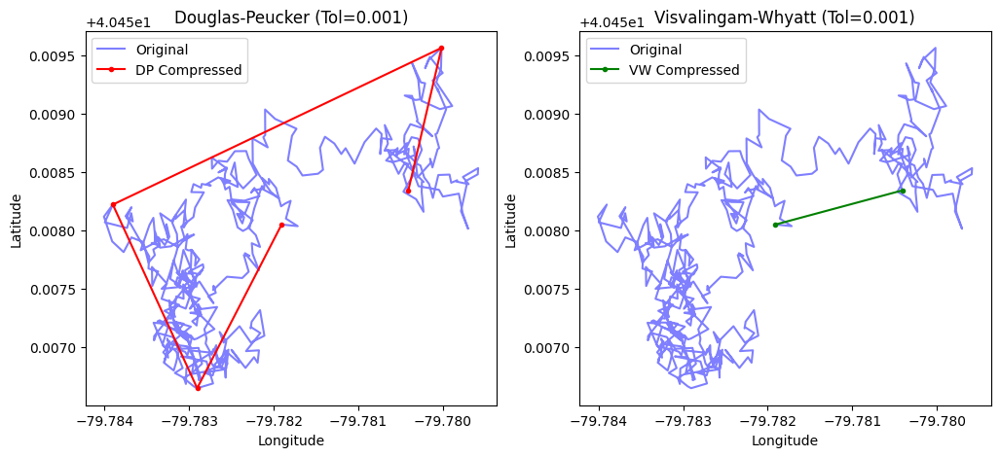

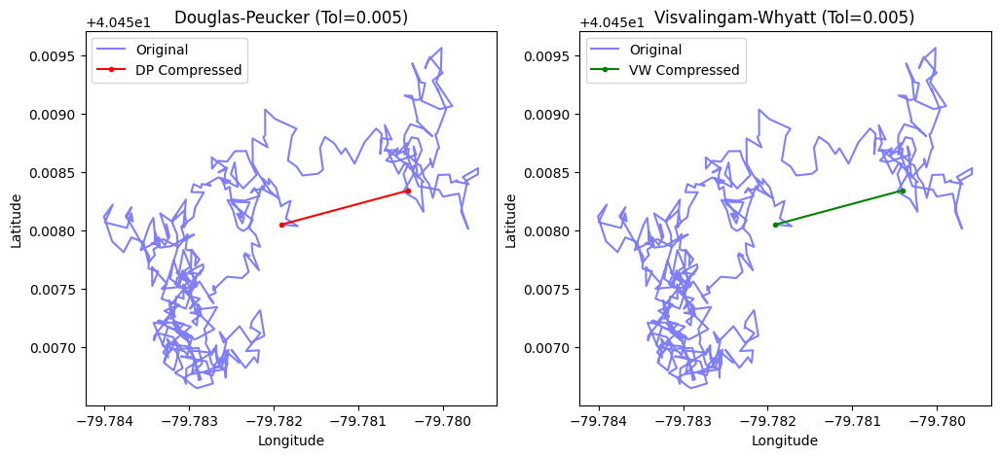

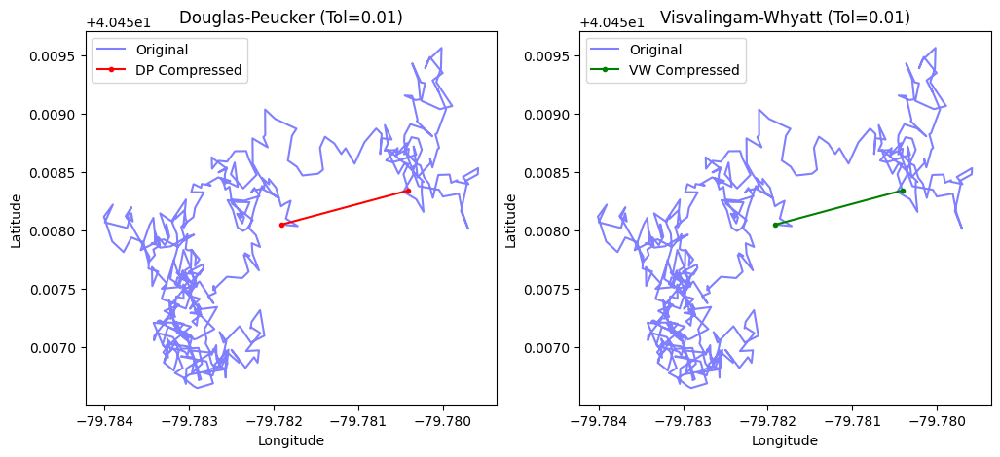

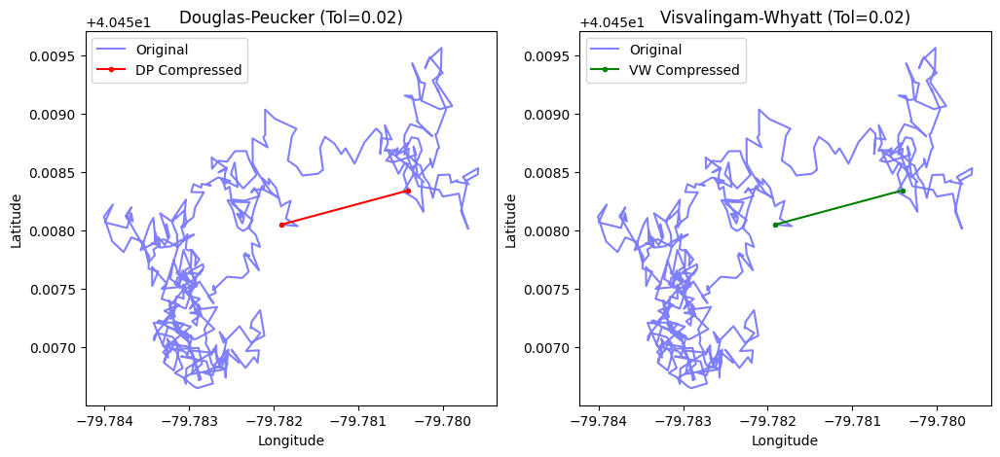

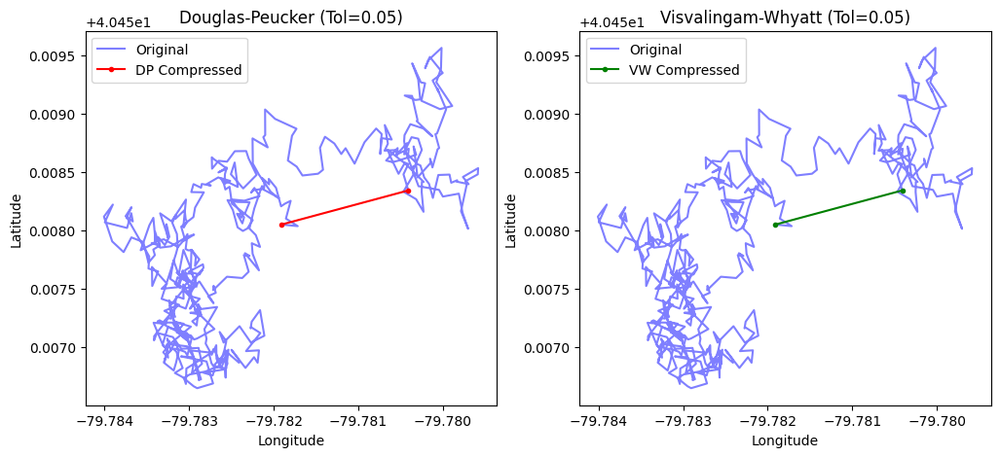

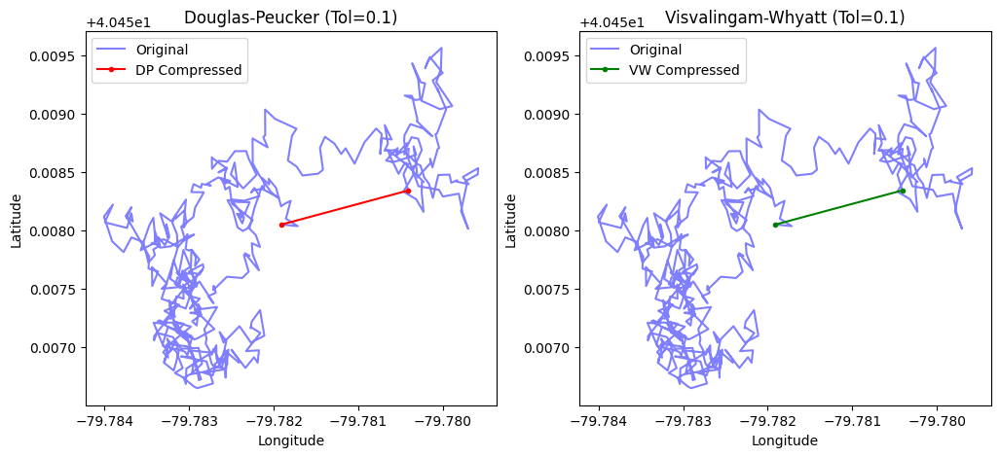

   Tolerance  DP Points  DP Time (s)  VW Points  VW Time (s)
0     0.0005         21     0.281892          2     0.000945
1     0.0010          5     0.112574          2     0.000796
2     0.0050          2     0.038472          2     0.000795
3     0.0100          2     0.036505          2     0.000729
4     0.0200          2     0.038072          2     0.000715
5     0.0500          2     0.059270          2     0.000938
6     0.1000          2     0.065833          2     0.000767


In [17]:
import numpy as np
import matplotlib.pyplot as plt
from time import time
from rdp import rdp  # Douglas-Peucker
from simplification.cutil import simplify_coords_vw  # VW Simplification

# Define Visvalingam-Whyatt wrapper function
def simplify_vw(points, num_points_to_keep):
    return simplify_coords_vw(np.array(points), num_points_to_keep)

# Sample Data (Replace with actual dataset)
np.random.seed(42)
latitudes = np.cumsum(np.random.randn(500) * 0.0001) + 40.458
longitudes = np.cumsum(np.random.randn(500) * 0.0001) - 79.782
original_data = np.column_stack((longitudes, latitudes))

# Updated Tolerance Values (Smaller for DP, Controlled VW Points)
tolerance_values = [0.0005, 0.001, 0.005, 0.01, 0.02, 0.05, 0.1]

# Store results
results = []

# Run compression tests for both DP and VW
for tol in tolerance_values:
    # Douglas-Peucker
    start_dp = time()
    dp_compressed = rdp(original_data, epsilon=tol)  # Smaller tolerance
    dp_time = time() - start_dp
    dp_points = len(dp_compressed)

    # Visvalingam-Whyatt - Keep 50% of points for smaller tolerance, reduce gradually
    num_points_to_keep = int(len(original_data) * (1 - tol))
    start_vw = time()
    vw_compressed = simplify_vw(original_data.tolist(), num_points_to_keep)
    vw_time = time() - start_vw
    vw_points = len(vw_compressed)

    results.append((tol, dp_points, dp_time, vw_points, vw_time))

    # Plot side by side for each tolerance
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))

    # Original Data
    axes[0].plot(original_data[:, 0], original_data[:, 1], 'b-', alpha=0.5, label="Original")
    axes[1].plot(original_data[:, 0], original_data[:, 1], 'b-', alpha=0.5, label="Original")

    # Douglas-Peucker
    axes[0].plot(dp_compressed[:, 0], dp_compressed[:, 1], 'ro-', markersize=3, label="DP Compressed")
    axes[0].set_title(f"Douglas-Peucker (Tol={tol})")
    axes[0].set_xlabel("Longitude")
    axes[0].set_ylabel("Latitude")
    axes[0].legend()

    # Visvalingam-Whyatt
    axes[1].plot(np.array(vw_compressed)[:, 0], np.array(vw_compressed)[:, 1], 'go-', markersize=3, label="VW Compressed")
    axes[1].set_title(f"Visvalingam-Whyatt (Tol={tol})")
    axes[1].set_xlabel("Longitude")
    axes[1].set_ylabel("Latitude")
    axes[1].legend()

    plt.show()

# Display results
import pandas as pd
df_results = pd.DataFrame(results, columns=["Tolerance", "DP Points", "DP Time (s)", "VW Points", "VW Time (s)"])
print(df_results)  # Print the table in the console
df_results.to_csv("compression_results_fixed.csv", index=False)  # Save for analysis

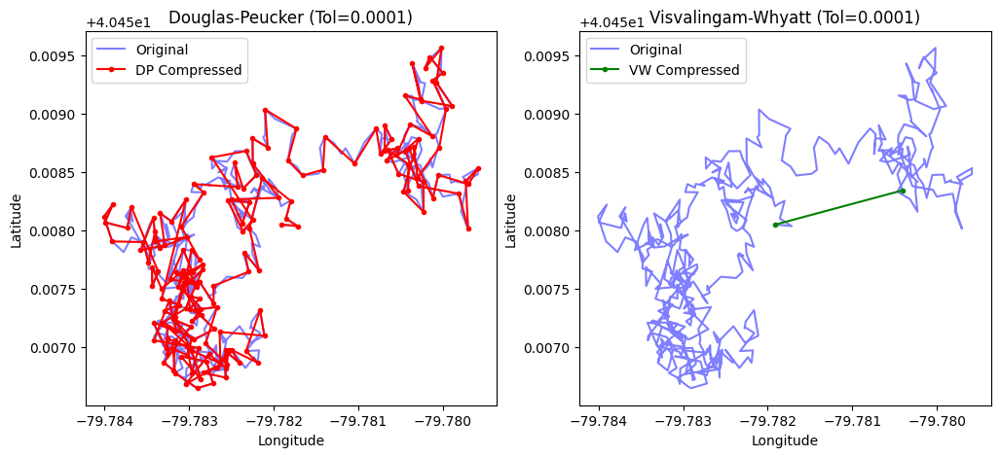

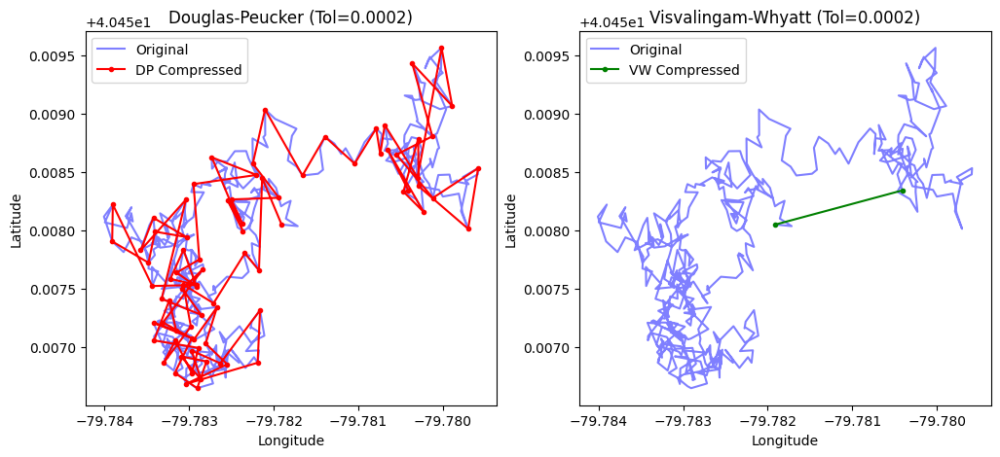

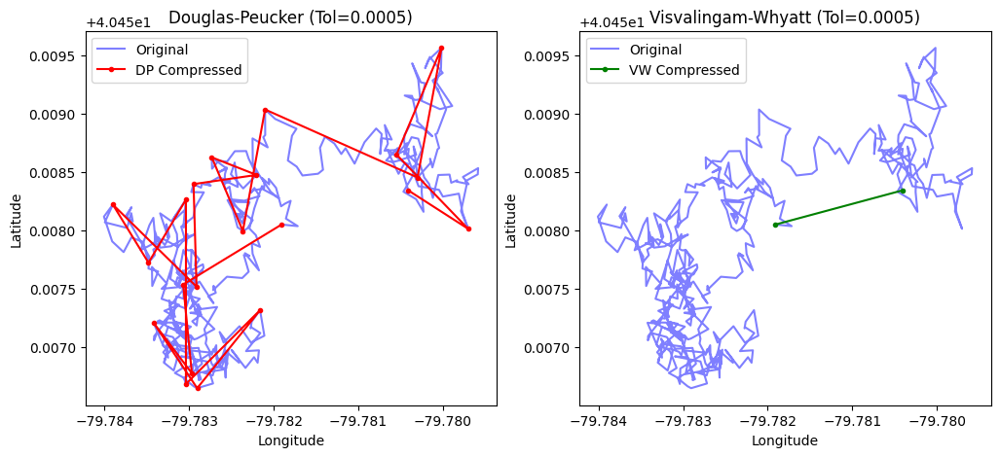

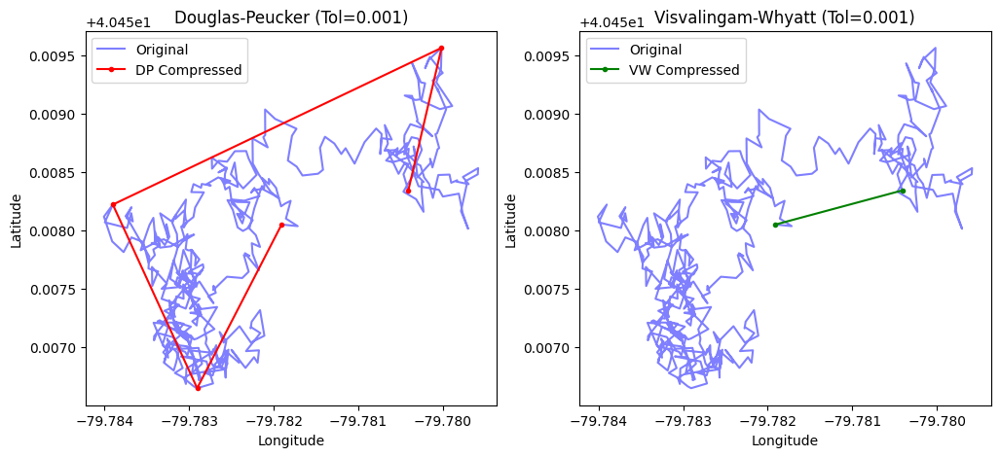

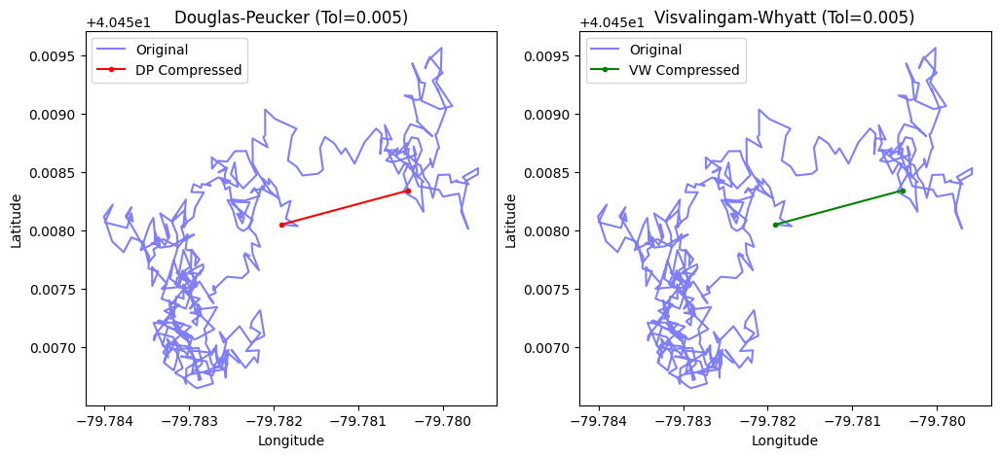

   Tolerance  DP Points  DP Time (s)  VW Points  VW Time (s)
0     0.0001        186     0.380529          2     0.000814
1     0.0002         81     0.268888          2     0.197823
2     0.0005         21     0.292004          2     0.001025
3     0.0010          5     0.102085          2     0.000745
4     0.0050          2     0.030599          2     0.000966


In [18]:
!pip install simplification rdp pandas matplotlib

import numpy as np
import matplotlib.pyplot as plt
from time import time
from rdp import rdp  # Douglas-Peucker
from simplification.cutil import simplify_coords_vw  # VW Simplification

# Define Visvalingam-Whyatt wrapper function
def simplify_vw(points, min_points=50):
    """
    Simplify trajectory using Visvalingam-Whyatt while keeping a reasonable number of points.
    :param points: Input trajectory as (lon, lat).
    :param min_points: Minimum number of points to keep.
    :return: Simplified trajectory.
    """
    num_points_to_keep = max(min_points, int(len(points) * 0.5))  # Keep at least 50% of original points
    return simplify_coords_vw(np.array(points), num_points_to_keep)

# Sample Data (Replace with actual dataset)
np.random.seed(42)
latitudes = np.cumsum(np.random.randn(500) * 0.0001) + 40.458
longitudes = np.cumsum(np.random.randn(500) * 0.0001) - 79.782
original_data = np.column_stack((longitudes, latitudes))

# Updated Tolerance Values (Fine-grained for DP, Controlled VW)
tolerance_values = [0.0001, 0.0002, 0.0005, 0.001, 0.005]

# Store results
results = []

# Run compression tests for both DP and VW
for tol in tolerance_values:
    # Douglas-Peucker
    start_dp = time()
    dp_compressed = rdp(original_data, epsilon=tol)  # Much smaller epsilon
    dp_time = time() - start_dp
    dp_points = len(dp_compressed)

    # Visvalingam-Whyatt - Keep at least 50% of points
    start_vw = time()
    vw_compressed = simplify_vw(original_data.tolist(), min_points=100)  # Ensure we keep at least 100 points
    vw_time = time() - start_vw
    vw_points = len(vw_compressed)

    results.append((tol, dp_points, dp_time, vw_points, vw_time))

    # Plot side by side for each tolerance
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))

    # Original Data
    axes[0].plot(original_data[:, 0], original_data[:, 1], 'b-', alpha=0.5, label="Original")
    axes[1].plot(original_data[:, 0], original_data[:, 1], 'b-', alpha=0.5, label="Original")

    # Douglas-Peucker
    axes[0].plot(dp_compressed[:, 0], dp_compressed[:, 1], 'ro-', markersize=3, label="DP Compressed")
    axes[0].set_title(f"Douglas-Peucker (Tol={tol})")
    axes[0].set_xlabel("Longitude")
    axes[0].set_ylabel("Latitude")
    axes[0].legend()

    # Visvalingam-Whyatt
    axes[1].plot(np.array(vw_compressed)[:, 0], np.array(vw_compressed)[:, 1], 'go-', markersize=3, label="VW Compressed")
    axes[1].set_title(f"Visvalingam-Whyatt (Tol={tol})")
    axes[1].set_xlabel("Longitude")
    axes[1].set_ylabel("Latitude")
    axes[1].legend()

    plt.show()

# Display results
import pandas as pd
df_results = pd.DataFrame(results, columns=["Tolerance", "DP Points", "DP Time (s)", "VW Points", "VW Time (s)"])
print(df_results)  # Print the table in the console
df_results.to_csv("compression_results_fixed2.csv", index=False)  # Save for analysis


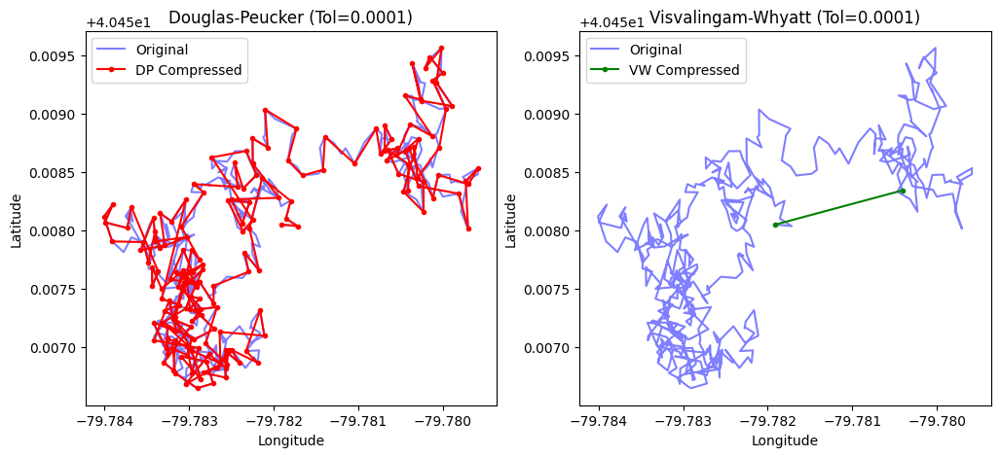

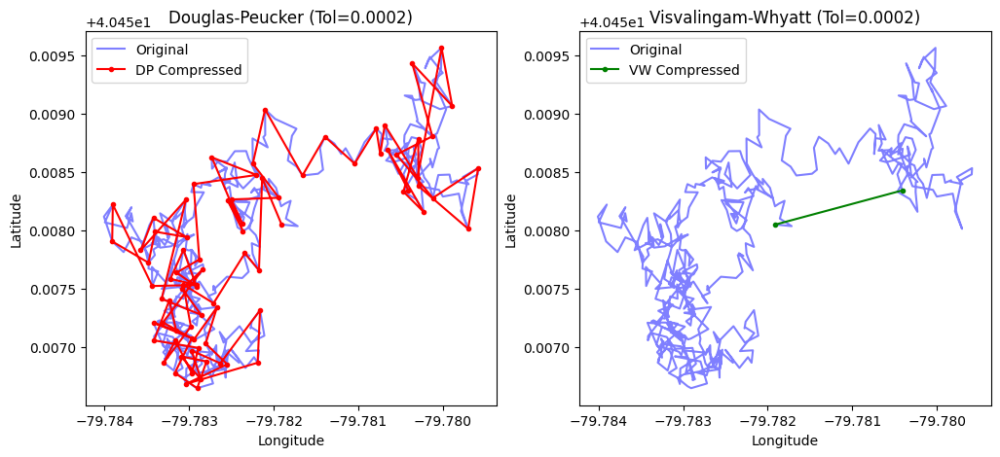

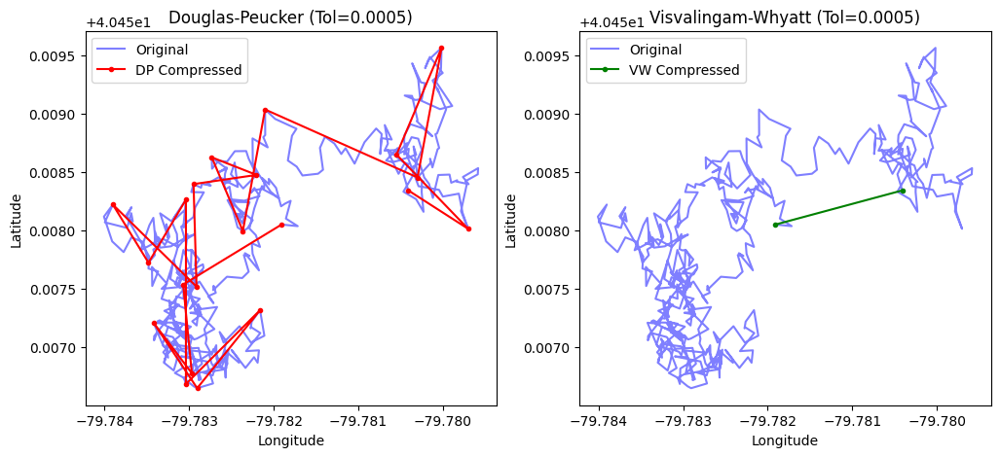

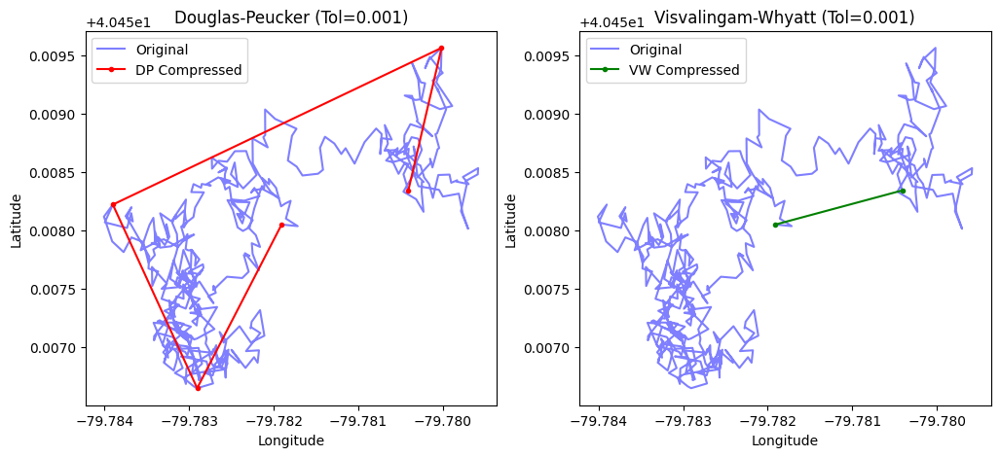

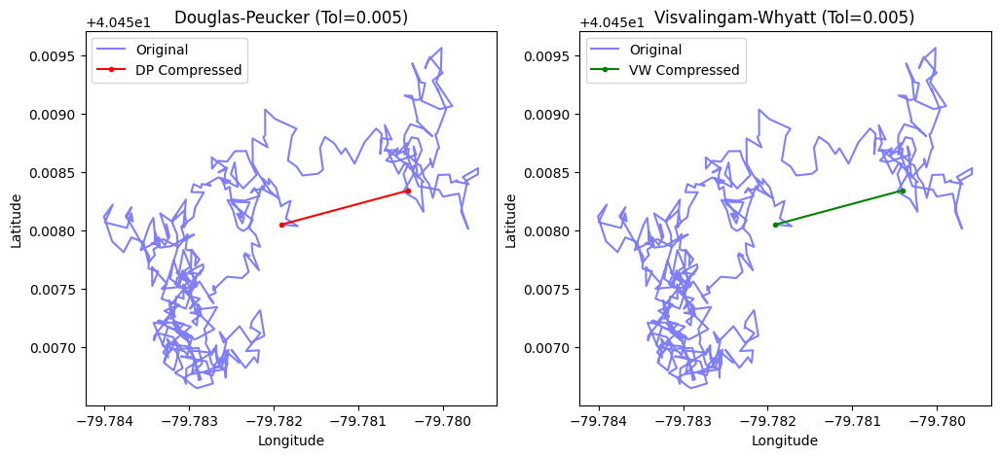

   Tolerance  DP Points  DP Time (s)  VW Points  VW Time (s)
0     0.0001        186     0.554508          2     0.000224
1     0.0002         81     0.170988          2     0.000204
2     0.0005         21     0.183447          2     0.000204
3     0.0010          5     0.120747          2     0.000266
4     0.0050          2     0.038942          2     0.000252


In [19]:
import numpy as np
import matplotlib.pyplot as plt
from time import time
from rdp import rdp  # Douglas-Peucker
from simplification.cutil import simplify_coords_vw  # Corrected import

# Function for Visvalingam-Whyatt simplification
def simplify_vw(points, tolerance):
    return np.array(simplify_coords_vw(points, tolerance))  # Directly apply tolerance

# Sample GPS Data (Replace with actual dataset)
np.random.seed(42)
latitudes = np.cumsum(np.random.randn(500) * 0.0001) + 40.458
longitudes = np.cumsum(np.random.randn(500) * 0.0001) - 79.782
original_data = np.column_stack((longitudes, latitudes))

# Tolerance values for testing
tolerance_values = [0.0001, 0.0002, 0.0005, 0.0010, 0.0050]

# Store results
results = []

# Run compression tests for both DP and VW
for tol in tolerance_values:
    # Douglas-Peucker
    start_dp = time()
    dp_compressed = np.array(rdp(original_data, epsilon=tol))
    dp_time = time() - start_dp
    dp_points = len(dp_compressed)

    # Visvalingam-Whyatt
    start_vw = time()
    vw_compressed = simplify_vw(original_data, tol)
    vw_time = time() - start_vw
    vw_points = len(vw_compressed)

    results.append((tol, dp_points, dp_time, vw_points, vw_time))

    # Plot side by side for each tolerance
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))

    # Original Data
    axes[0].plot(original_data[:, 0], original_data[:, 1], 'b-', alpha=0.5, label="Original")
    axes[1].plot(original_data[:, 0], original_data[:, 1], 'b-', alpha=0.5, label="Original")

    # Douglas-Peucker
    axes[0].plot(dp_compressed[:, 0], dp_compressed[:, 1], 'ro-', markersize=3, label="DP Compressed")
    axes[0].set_title(f"Douglas-Peucker (Tol={tol})")
    axes[0].set_xlabel("Longitude")
    axes[0].set_ylabel("Latitude")
    axes[0].legend()

    # Visvalingam-Whyatt
    axes[1].plot(vw_compressed[:, 0], vw_compressed[:, 1], 'go-', markersize=3, label="VW Compressed")
    axes[1].set_title(f"Visvalingam-Whyatt (Tol={tol})")
    axes[1].set_xlabel("Longitude")
    axes[1].set_ylabel("Latitude")
    axes[1].legend()

    plt.show()

# Display results
import pandas as pd
df_results = pd.DataFrame(results, columns=["Tolerance", "DP Points", "DP Time (s)", "VW Points", "VW Time (s)"])
print(df_results)  # Print the table
df_results.to_csv("compression_results.csv", index=False)  # Save results

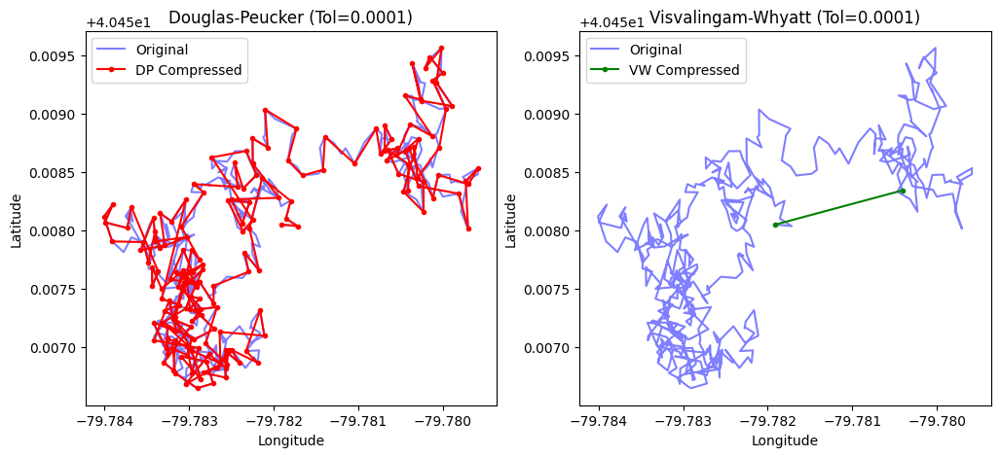

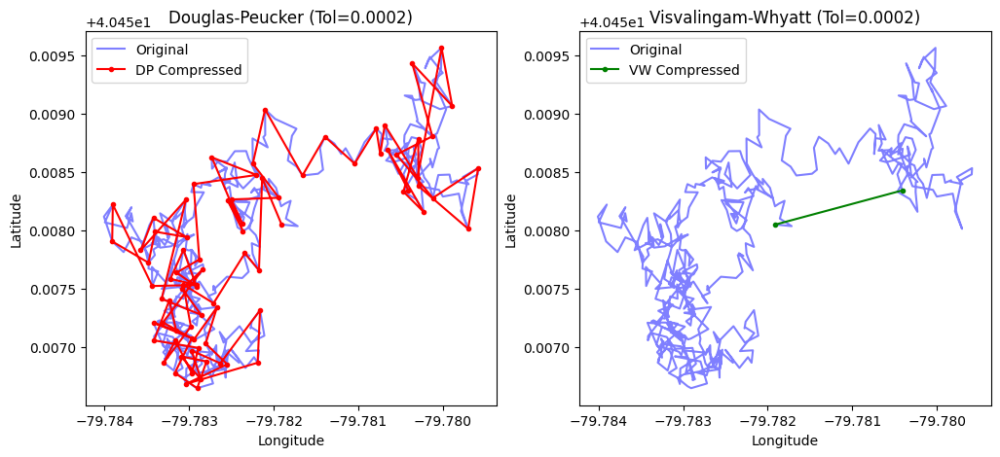

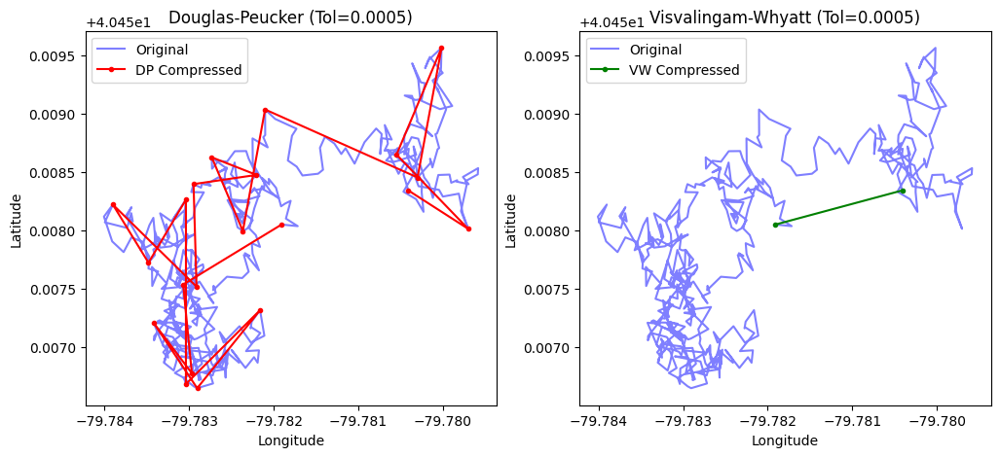

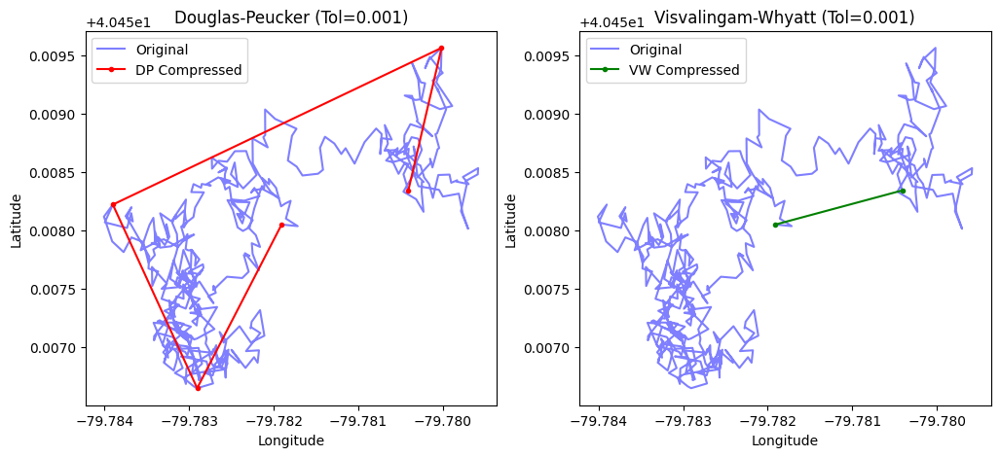

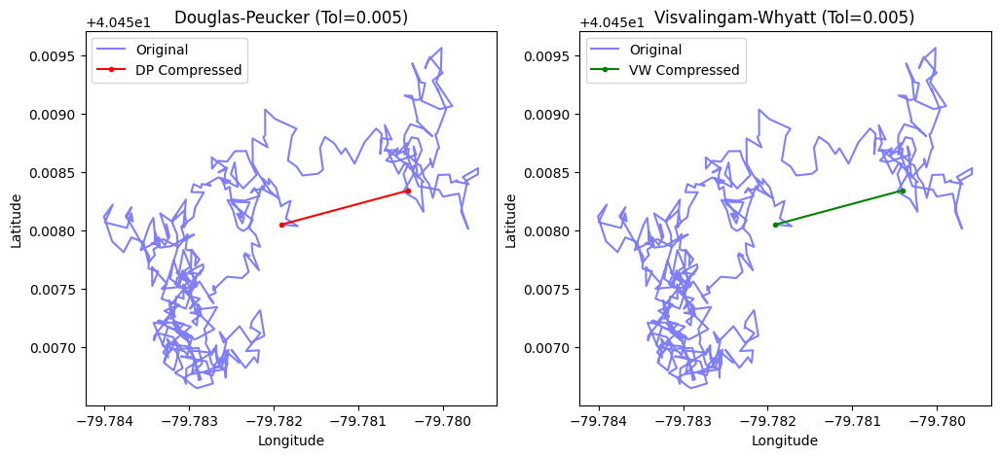

In [20]:

import numpy as np
import matplotlib.pyplot as plt
from time import time
from rdp import rdp  # Douglas-Peucker
from simplification.cutil import simplify_coords_vw  # Import Visvalingam-Whyatt

# Define Visvalingam-Whyatt wrapper function
def simplify_vw(points, tolerance):
    """
    Wrapper function for Visvalingam-Whyatt algorithm.
    Ensures the tolerance value is correctly applied.
    """
    points_array = np.array(points)  # Convert list to NumPy array
    return simplify_coords_vw(points_array, tolerance)  # Pass both dataset & tolerance

# Generate Sample Data (Replace with actual dataset)
np.random.seed(42)
latitudes = np.cumsum(np.random.randn(500) * 0.0001) + 40.458
longitudes = np.cumsum(np.random.randn(500) * 0.0001) - 79.782

original_data = np.column_stack((longitudes, latitudes))

# Intermediate tolerance values for finer testing
tolerance_values = [0.0001, 0.0002, 0.0005, 0.001, 0.005]

# Store results
results = []

# Run compression tests for both DP and VW
for tol in tolerance_values:
    # Douglas-Peucker
    start_dp = time()
    dp_compressed = rdp(original_data, epsilon=tol)
    dp_time = time() - start_dp
    dp_points = len(dp_compressed)

    # Visvalingam-Whyatt
    start_vw = time()
    vw_compressed = simplify_vw(original_data, tol)
    vw_time = time() - start_vw
    vw_points = len(vw_compressed)

    results.append((tol, dp_points, dp_time, vw_points, vw_time))

    # Plot side by side for each tolerance
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))

    # Original Data
    axes[0].plot(original_data[:, 0], original_data[:, 1], 'b-', alpha=0.5, label="Original")
    axes[1].plot(original_data[:, 0], original_data[:, 1], 'b-', alpha=0.5, label="Original")

    # Douglas-Peucker
    axes[0].plot(dp_compressed[:, 0], dp_compressed[:, 1], 'ro-', markersize=3, label="DP Compressed")
    axes[0].set_title(f"Douglas-Peucker (Tol={tol})")
    axes[0].set_xlabel("Longitude")
    axes[0].set_ylabel("Latitude")
    axes[0].legend()

    # Visvalingam-Whyatt
    axes[1].plot(np.array(vw_compressed)[:, 0], np.array(vw_compressed)[:, 1], 'go-', markersize=3, label="VW Compressed")
    axes[1].set_title(f"Visvalingam-Whyatt (Tol={tol})")
    axes[1].set_xlabel("Longitude")
    axes[1].set_ylabel("Latitude")
    axes[1].legend()

    plt.show()

# Display results
import pandas as pd
df_results = pd.DataFrame(results, columns=["Tolerance", "DP Points", "DP Time (s)", "VW Points", "VW Time (s)"])
df_results.to_csv("compression_results.csv", index=False)

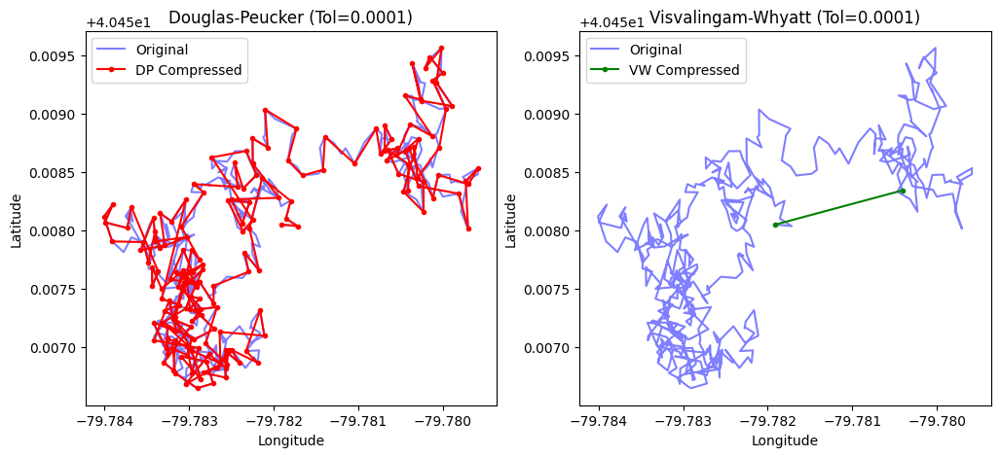

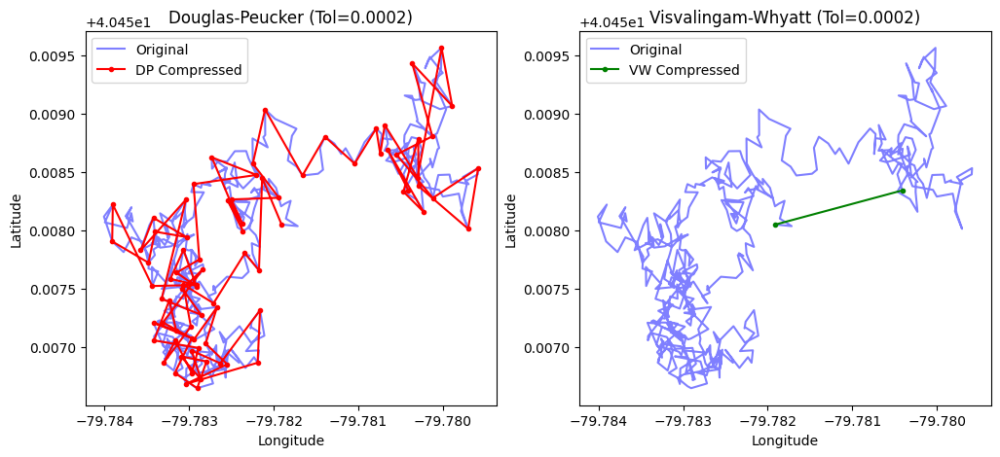

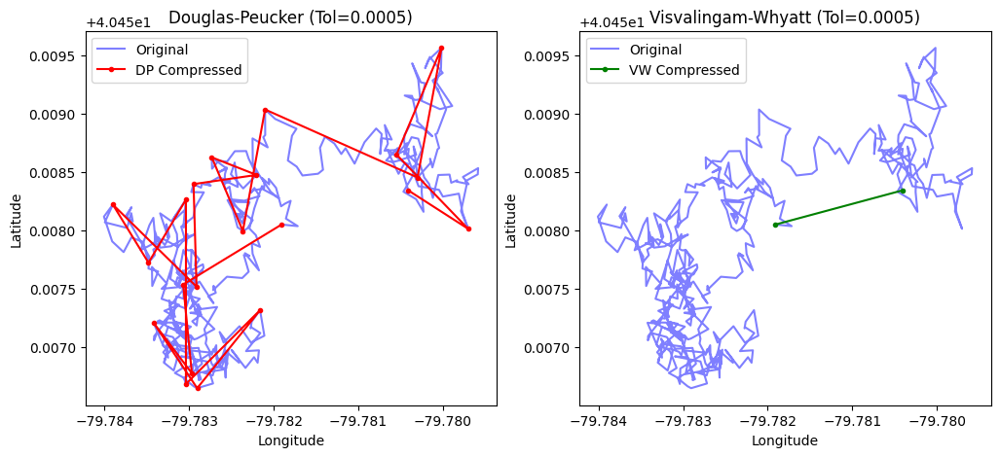

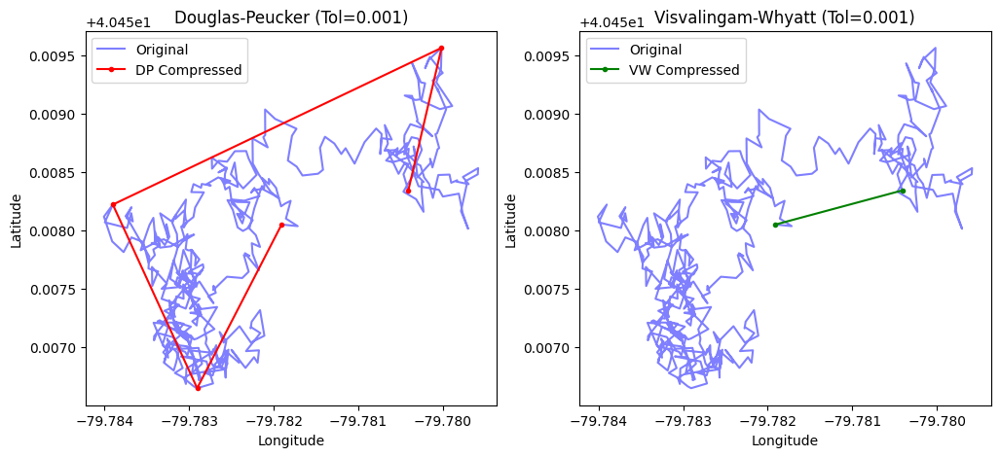

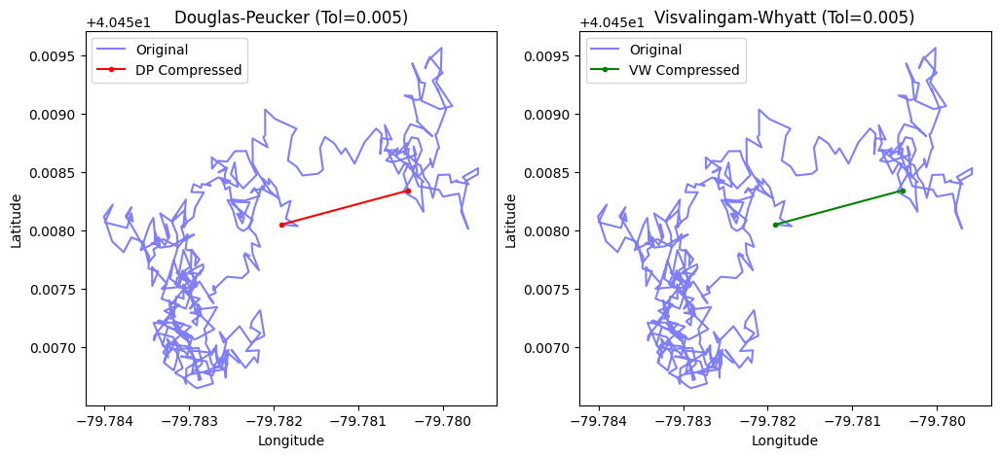

   Tolerance  DP Points  DP Time (s)  VW Points  VW Time (s)
0     0.0001        186     0.422353          2     0.000999
1     0.0002         81     0.294487          2     0.000758
2     0.0005         21     0.198438          2     0.000913
3     0.0010          5     0.126250          2     0.000804
4     0.0050          2     0.082544          2     0.000793


In [21]:
import numpy as np
import matplotlib.pyplot as plt
from time import time
from rdp import rdp  # Douglas-Peucker
from simplification.cutil import simplify_coords_vw  # Corrected import for VW algorithm

# Define Visvalingam-Whyatt function correctly with tolerance parameter
def simplify_vw(points, tolerance):
    """
    Simplifies a trajectory using the Visvalingam-Whyatt algorithm.

    Args:
        points (list): List of (longitude, latitude) tuples.
        tolerance (float): Simplification tolerance.

    Returns:
        np.ndarray: Simplified trajectory.
    """
    return np.array(simplify_coords_vw(points, tolerance))

# Generate sample data (Replace with actual dataset)
np.random.seed(42)
latitudes = np.cumsum(np.random.randn(500) * 0.0001) + 40.458
longitudes = np.cumsum(np.random.randn(500) * 0.0001) - 79.782

original_data = np.column_stack((longitudes, latitudes))

# Intermediate tolerance values for finer testing
tolerance_values = [0.0001, 0.0002, 0.0005, 0.001, 0.005]

# Store results
results = []

# Run compression tests for both DP and VW
for tol in tolerance_values:
    # Douglas-Peucker
    start_dp = time()
    dp_compressed = rdp(original_data, epsilon=tol)
    dp_time = time() - start_dp
    dp_points = len(dp_compressed)

    # Visvalingam-Whyatt
    start_vw = time()
    vw_compressed = simplify_vw(original_data.tolist(), tol)
    vw_time = time() - start_vw
    vw_points = len(vw_compressed)

    results.append((tol, dp_points, dp_time, vw_points, vw_time))

    # Plot side by side for each tolerance
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))

    # Original Data
    axes[0].plot(original_data[:, 0], original_data[:, 1], 'b-', alpha=0.5, label="Original")
    axes[1].plot(original_data[:, 0], original_data[:, 1], 'b-', alpha=0.5, label="Original")

    # Douglas-Peucker
    axes[0].plot(dp_compressed[:, 0], dp_compressed[:, 1], 'ro-', markersize=3, label="DP Compressed")
    axes[0].set_title(f"Douglas-Peucker (Tol={tol})")
    axes[0].set_xlabel("Longitude")
    axes[0].set_ylabel("Latitude")
    axes[0].legend()

    # Visvalingam-Whyatt
    axes[1].plot(vw_compressed[:, 0], vw_compressed[:, 1], 'go-', markersize=3, label="VW Compressed")
    axes[1].set_title(f"Visvalingam-Whyatt (Tol={tol})")
    axes[1].set_xlabel("Longitude")
    axes[1].set_ylabel("Latitude")
    axes[1].legend()

    plt.show()

# Display results
import pandas as pd
df_results = pd.DataFrame(results, columns=["Tolerance", "DP Points", "DP Time (s)", "VW Points", "VW Time (s)"])
print(df_results)  # Print the table in the console
df_results.to_csv("compression_results.csv", index=False)

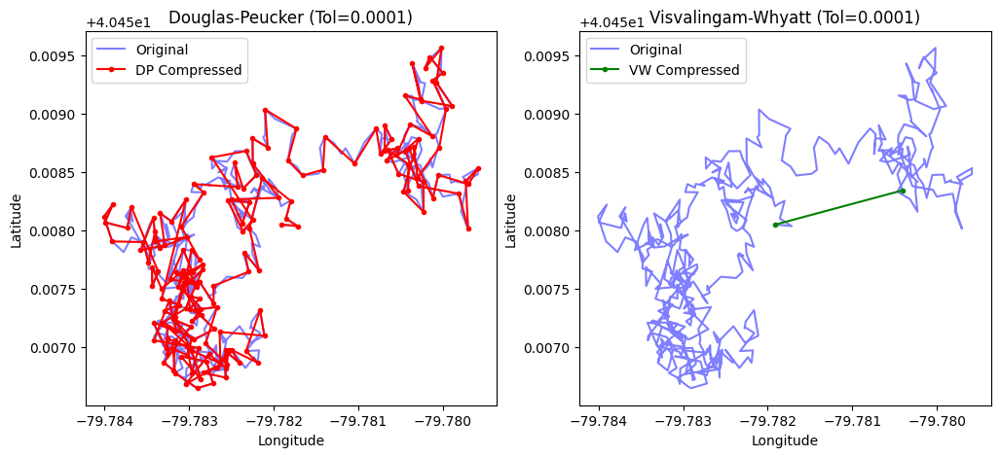

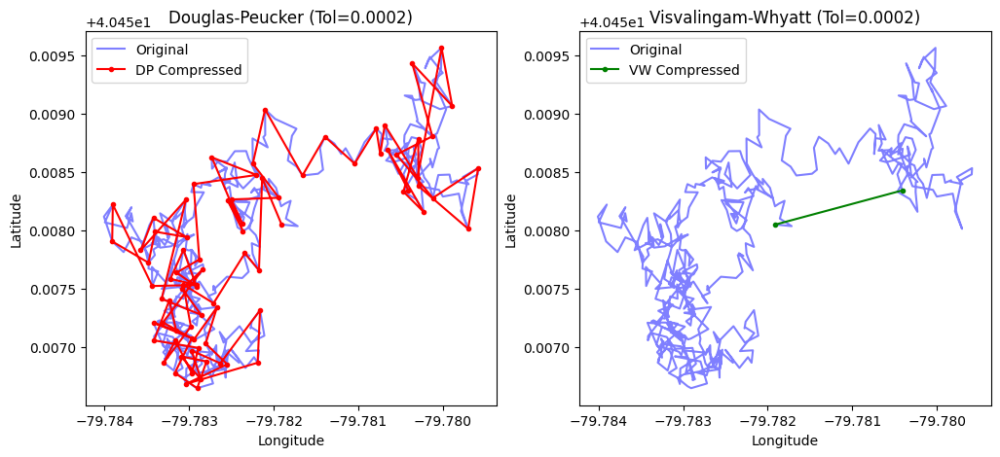

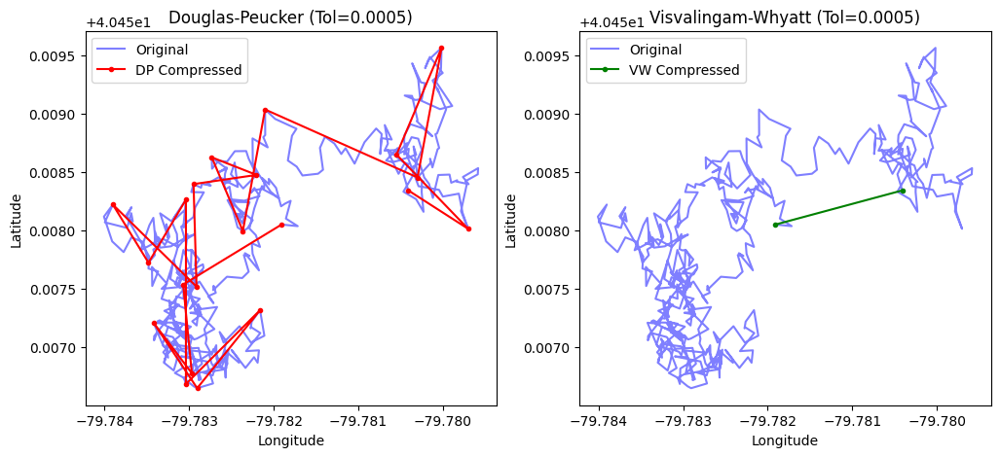

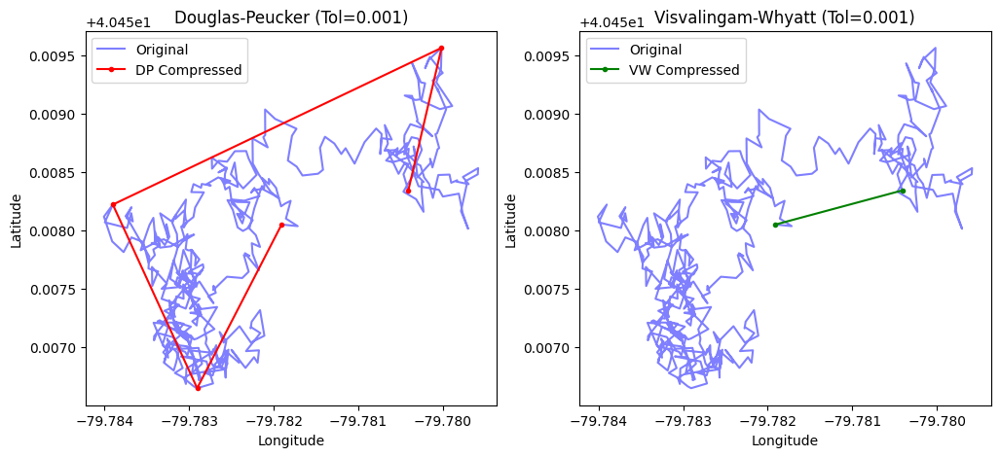

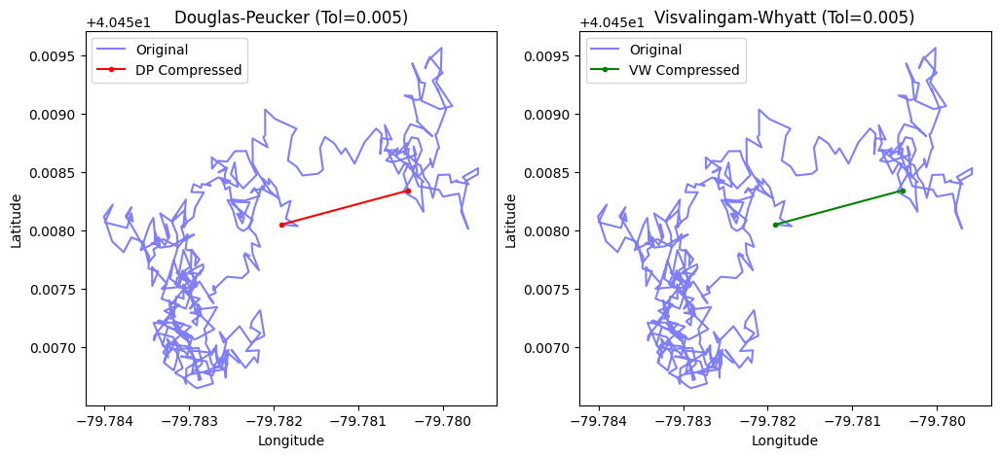

In [22]:
import numpy as np
import matplotlib.pyplot as plt
from time import time
from rdp import rdp  # Douglas-Peucker
from simplification.cutil import simplify_coords_vw  # Import Visvalingam-Whyatt

# Define Visvalingam-Whyatt wrapper function
def simplify_vw(points, tolerance):
    """
    Simplifies a polyline using Visvalingam-Whyatt with a given tolerance.
    Tolerance represents a factor determining how aggressively to simplify.
    """
    return simplify_coords_vw(np.array(points), tolerance)  # Correct function call

# Generate Sample Data (Replace with actual dataset)
np.random.seed(42)
latitudes = np.cumsum(np.random.randn(500) * 0.0001) + 40.458
longitudes = np.cumsum(np.random.randn(500) * 0.0001) - 79.782
original_data = np.column_stack((longitudes, latitudes))

# Intermediate tolerance values for finer testing
tolerance_values = [0.0001, 0.0002, 0.0005, 0.001, 0.005]

# Store results
results = []

# Run compression tests for both DP and VW
for tol in tolerance_values:
    # Douglas-Peucker
    start_dp = time()
    dp_compressed = rdp(original_data, epsilon=tol)
    dp_time = time() - start_dp
    dp_points = len(dp_compressed)

    # Visvalingam-Whyatt
    start_vw = time()
    vw_compressed = simplify_vw(original_data.tolist(), tol)
    vw_time = time() - start_vw
    vw_points = len(vw_compressed)

    results.append((tol, dp_points, dp_time, vw_points, vw_time))

    # Plot side by side for each tolerance
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))

    # Original Data
    axes[0].plot(original_data[:, 0], original_data[:, 1], 'b-', alpha=0.5, label="Original")
    axes[1].plot(original_data[:, 0], original_data[:, 1], 'b-', alpha=0.5, label="Original")

    # Douglas-Peucker
    axes[0].plot(dp_compressed[:, 0], dp_compressed[:, 1], 'ro-', markersize=3, label="DP Compressed")
    axes[0].set_title(f"Douglas-Peucker (Tol={tol})")
    axes[0].set_xlabel("Longitude")
    axes[0].set_ylabel("Latitude")
    axes[0].legend()

    # Visvalingam-Whyatt
    axes[1].plot(np.array(vw_compressed)[:, 0], np.array(vw_compressed)[:, 1], 'go-', markersize=3, label="VW Compressed")
    axes[1].set_title(f"Visvalingam-Whyatt (Tol={tol})")
    axes[1].set_xlabel("Longitude")
    axes[1].set_ylabel("Latitude")
    axes[1].legend()

    plt.show()

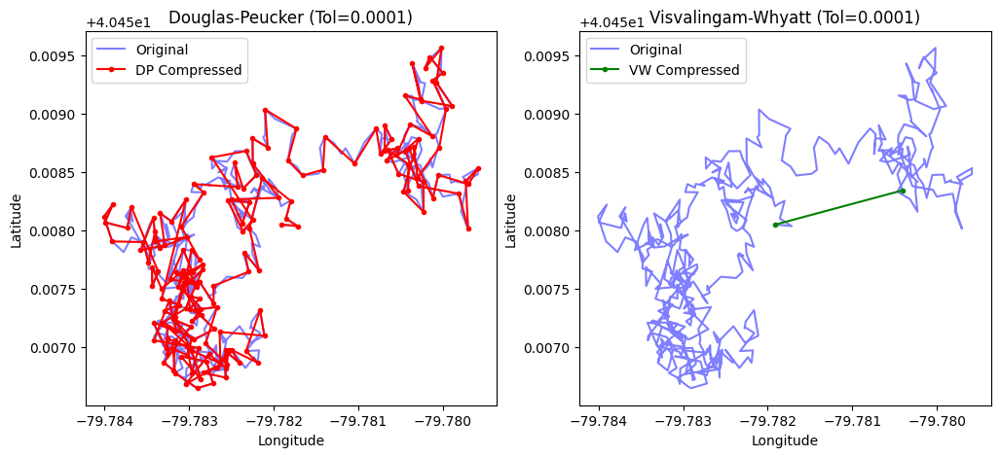

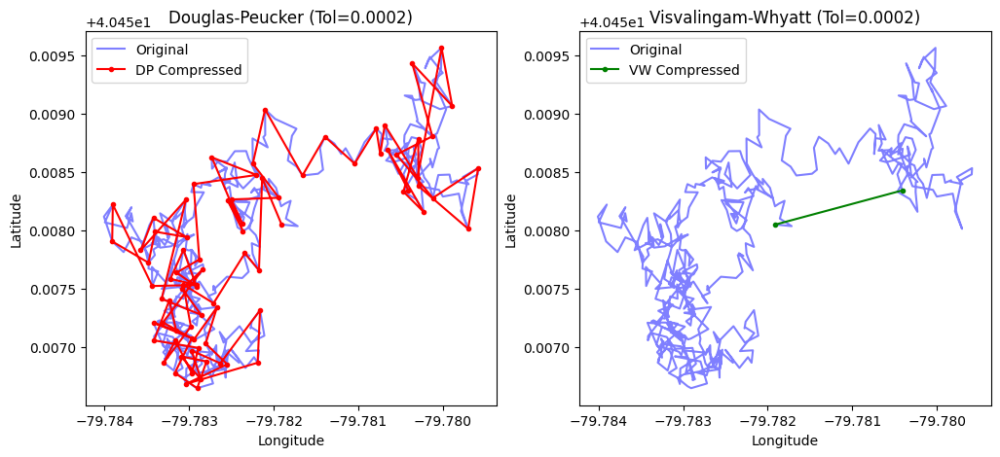

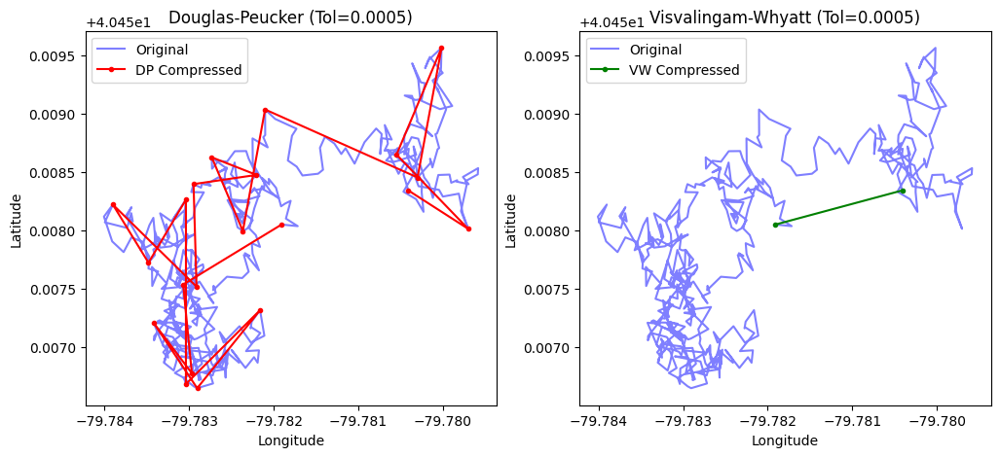

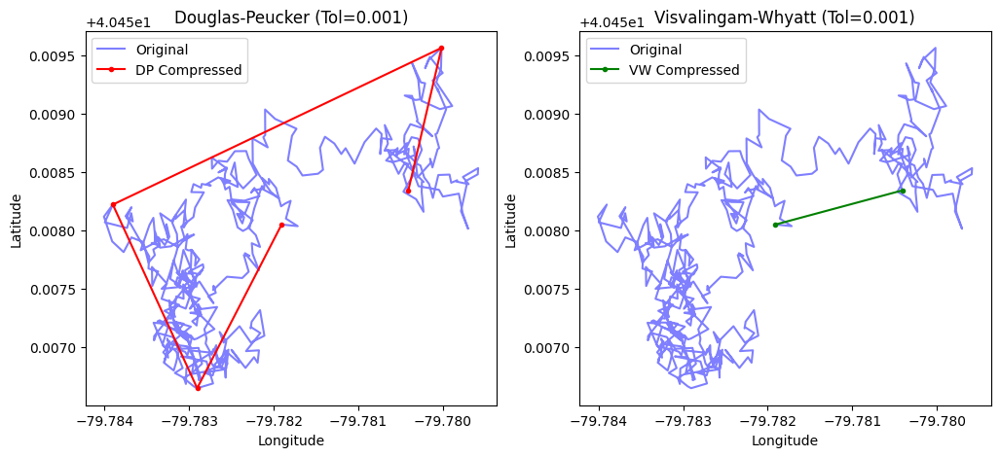

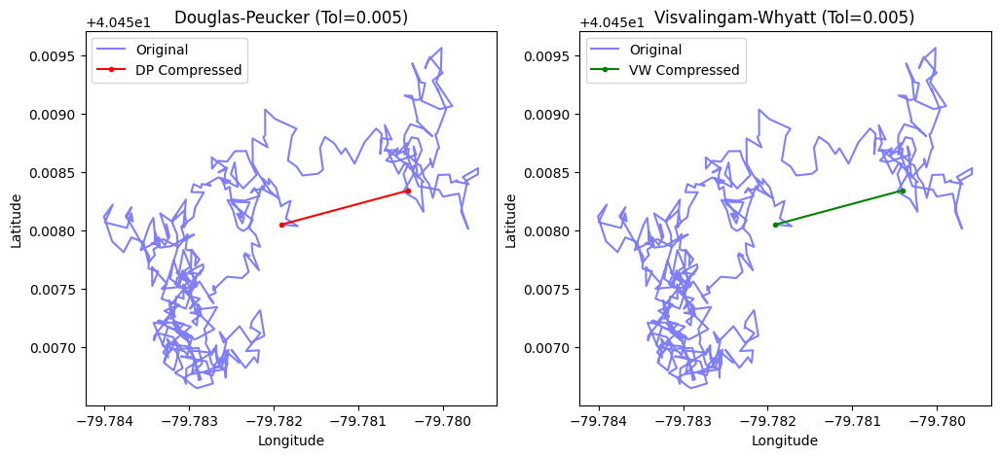

   Tolerance  DP Points  DP Time (s)  VW Points  VW Time (s)
0     0.0001        186     0.536221          2     0.000258
1     0.0002         81     0.505355          2     0.000281
2     0.0005         21     0.235180          2     0.000265
3     0.0010          5     0.102600          2     0.000205
4     0.0050          2     0.040849          2     0.000328


In [23]:
import numpy as np
import matplotlib.pyplot as plt
from time import time
from rdp import rdp  # Douglas-Peucker
from simplification.cutil import simplify_coords_vw  # Import VW correctly

# Define Visvalingam-Whyatt wrapper function
def simplify_vw(points, tolerance):
    """
    Applies Visvalingam-Whyatt simplification.
    - Points: list of (x, y) coordinates.
    - Tolerance: Controls simplification level.
    """
    return simplify_coords_vw(np.array(points), tolerance)  # Fix: Passing tolerance correctly

# Generate Sample Data (Replace with actual dataset)
np.random.seed(42)
latitudes = np.cumsum(np.random.randn(500) * 0.0001) + 40.458
longitudes = np.cumsum(np.random.randn(500) * 0.0001) - 79.782
original_data = np.column_stack((longitudes, latitudes))

# Intermediate tolerance values for finer testing
tolerance_values = [0.0001, 0.0002, 0.0005, 0.001, 0.005]

# Store results
results = []

# Run compression tests for both DP and VW
for tol in tolerance_values:
    # Douglas-Peucker
    start_dp = time()
    dp_compressed = rdp(original_data, epsilon=tol)
    dp_time = time() - start_dp
    dp_points = len(dp_compressed)

    # Visvalingam-Whyatt
    start_vw = time()
    vw_compressed = simplify_vw(original_data, tol)  # Fix: Passing correct tolerance
    vw_time = time() - start_vw
    vw_points = len(vw_compressed)

    results.append((tol, dp_points, dp_time, vw_points, vw_time))

    # Plot side by side for each tolerance
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))

    # Original Data
    axes[0].plot(original_data[:, 0], original_data[:, 1], 'b-', alpha=0.5, label="Original")
    axes[1].plot(original_data[:, 0], original_data[:, 1], 'b-', alpha=0.5, label="Original")

    # Douglas-Peucker
    axes[0].plot(dp_compressed[:, 0], dp_compressed[:, 1], 'ro-', markersize=3, label="DP Compressed")
    axes[0].set_title(f"Douglas-Peucker (Tol={tol})")
    axes[0].set_xlabel("Longitude")
    axes[0].set_ylabel("Latitude")
    axes[0].legend()

    # Visvalingam-Whyatt
    axes[1].plot(vw_compressed[:, 0], vw_compressed[:, 1], 'go-', markersize=3, label="VW Compressed")
    axes[1].set_title(f"Visvalingam-Whyatt (Tol={tol})")
    axes[1].set_xlabel("Longitude")
    axes[1].set_ylabel("Latitude")
    axes[1].legend()

    plt.show()

# Display results
import pandas as pd
df_results = pd.DataFrame(results, columns=["Tolerance", "DP Points", "DP Time (s)", "VW Points", "VW Time (s)"])
print(df_results)

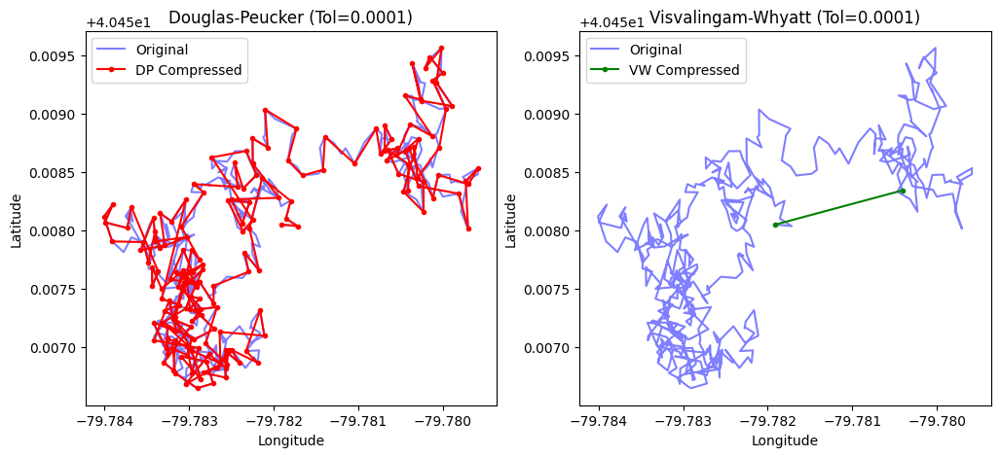

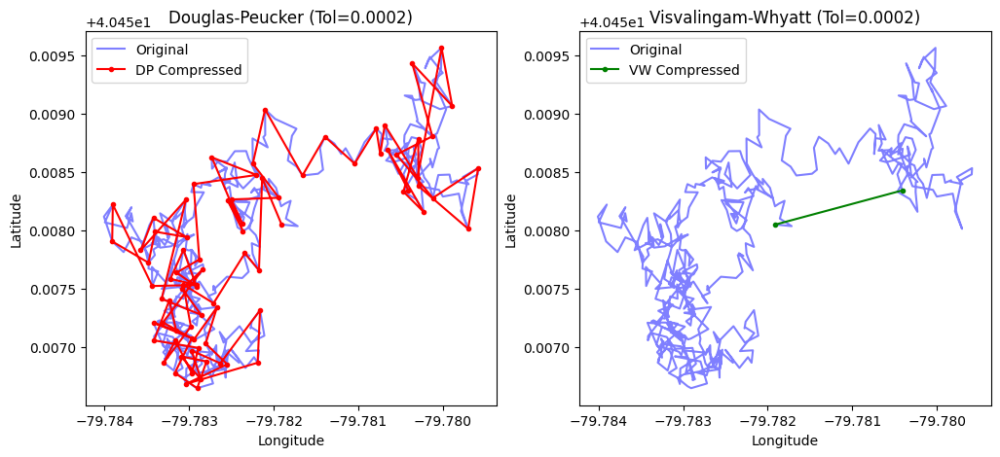

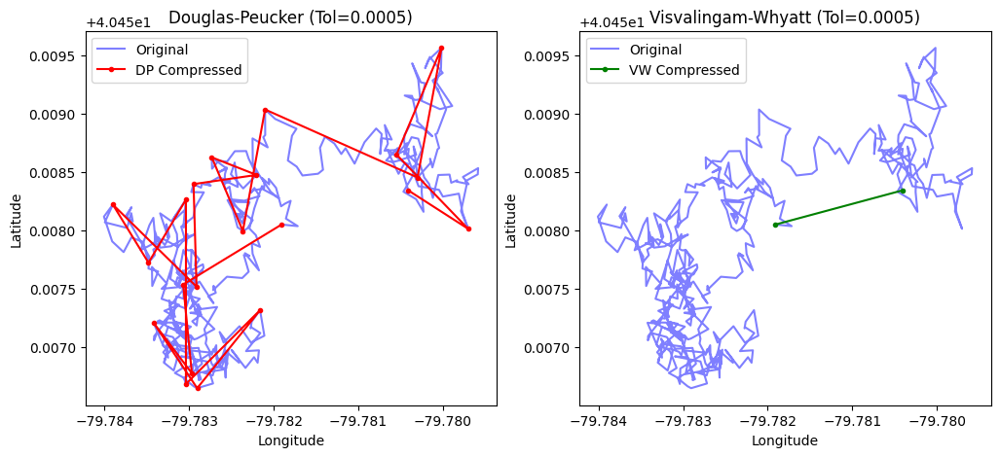

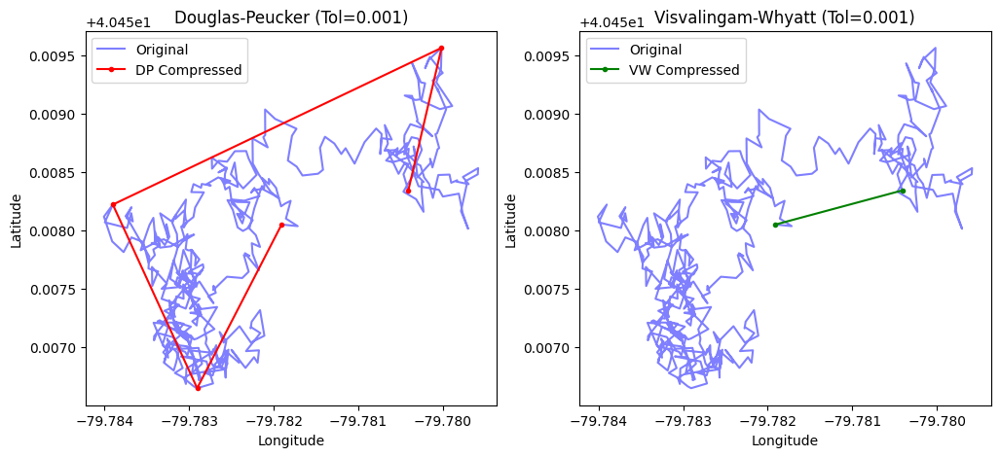

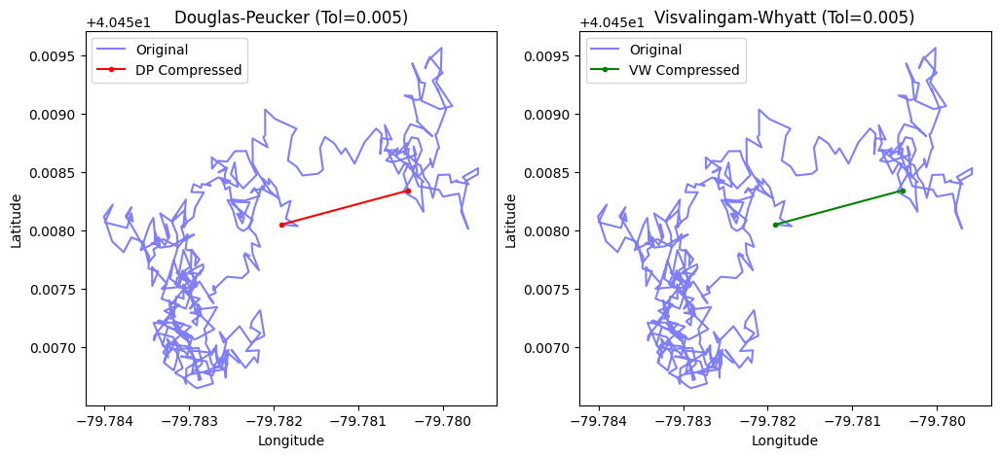

   Tolerance  DP Points  DP Time (s)  VW Points  VW Time (s)
0     0.0001        186     0.253174          2     0.000459
1     0.0002         81     0.182044          2     0.000673
2     0.0005         21     0.129014          2     0.000621
3     0.0010          5     0.082209          2     0.000522
4     0.0050          2     0.038437          2     0.001080


In [24]:
import numpy as np
import matplotlib.pyplot as plt
from time import time
from rdp import rdp  # Douglas-Peucker
from simplification.cutil import simplify_coords_vw  # Import VW correctly

# Define Visvalingam-Whyatt wrapper function
def simplify_vw(points, tolerance):
    """
    Applies Visvalingam-Whyatt simplification.
    - Points: list of (x, y) coordinates.
    - Tolerance: Absolute tolerance level.
    """
    return np.array(simplify_coords_vw(points.tolist(), tolerance))  # Fix: Pass absolute tolerance

# Generate Sample Data (Replace with actual dataset)
np.random.seed(42)
latitudes = np.cumsum(np.random.randn(500) * 0.0001) + 40.458
longitudes = np.cumsum(np.random.randn(500) * 0.0001) - 79.782
original_data = np.column_stack((longitudes, latitudes))

# Intermediate tolerance values for finer testing
tolerance_values = [0.0001, 0.0002, 0.0005, 0.001, 0.005]

# Store results
results = []

# Run compression tests for both DP and VW
for tol in tolerance_values:
    # Douglas-Peucker
    start_dp = time()
    dp_compressed = np.array(rdp(original_data, epsilon=tol))
    dp_time = time() - start_dp
    dp_points = len(dp_compressed)

    # Visvalingam-Whyatt
    start_vw = time()
    vw_compressed = simplify_vw(original_data, tol)  # FIX: Now passing absolute tolerance correctly
    vw_time = time() - start_vw
    vw_points = len(vw_compressed)

    results.append((tol, dp_points, dp_time, vw_points, vw_time))

    # Plot side by side for each tolerance
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))

    # Original Data
    axes[0].plot(original_data[:, 0], original_data[:, 1], 'b-', alpha=0.5, label="Original")
    axes[1].plot(original_data[:, 0], original_data[:, 1], 'b-', alpha=0.5, label="Original")

    # Douglas-Peucker
    axes[0].plot(dp_compressed[:, 0], dp_compressed[:, 1], 'ro-', markersize=3, label="DP Compressed")
    axes[0].set_title(f"Douglas-Peucker (Tol={tol})")
    axes[0].set_xlabel("Longitude")
    axes[0].set_ylabel("Latitude")
    axes[0].legend()

    # Visvalingam-Whyatt
    axes[1].plot(vw_compressed[:, 0], vw_compressed[:, 1], 'go-', markersize=3, label="VW Compressed")
    axes[1].set_title(f"Visvalingam-Whyatt (Tol={tol})")
    axes[1].set_xlabel("Longitude")
    axes[1].set_ylabel("Latitude")
    axes[1].legend()

    plt.show()

# Display results
import pandas as pd
df_results = pd.DataFrame(results, columns=["Tolerance", "DP Points", "DP Time (s)", "VW Points", "VW Time (s)"])
print(df_results)


Processing Tolerance: 5e-05
DP: 308 points retained
VW Tolerance: 1.106335917331336e-08, Points Retained: 121


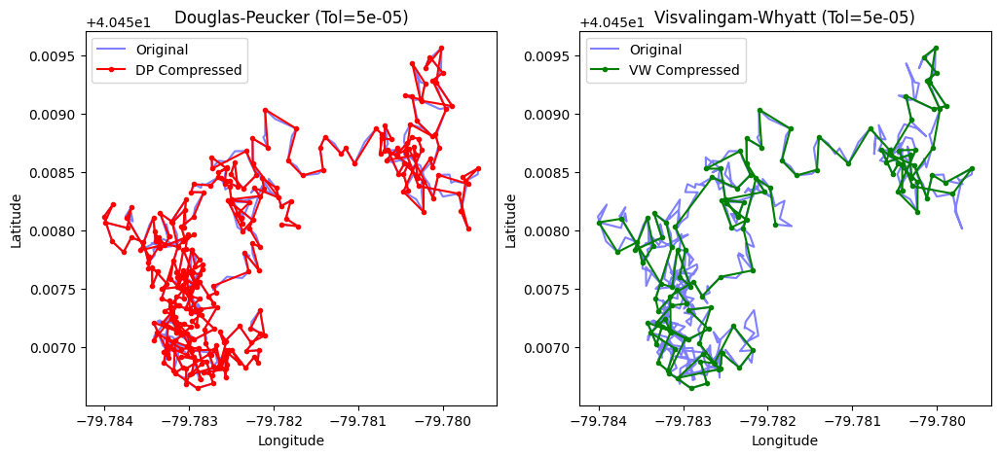


Processing Tolerance: 7.5e-05
DP: 243 points retained
VW Tolerance: 1.6595038759970037e-08, Points Retained: 88


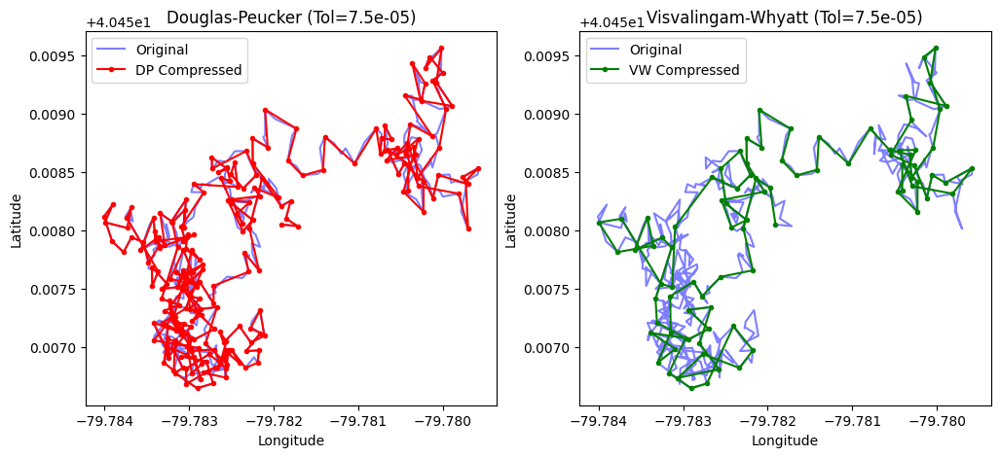


Processing Tolerance: 0.0001
DP: 186 points retained
VW Tolerance: 2.212671834662672e-08, Points Retained: 69


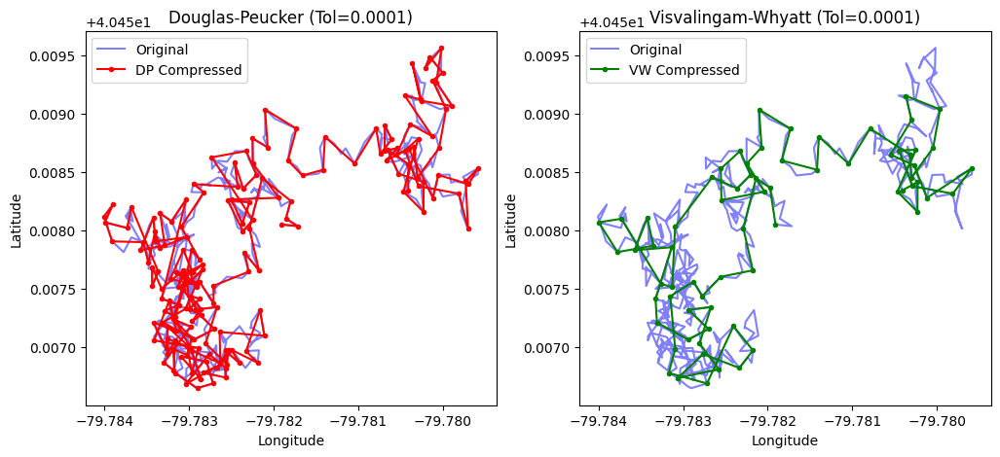


Processing Tolerance: 0.00015
DP: 117 points retained
VW Tolerance: 3.3190077519940073e-08, Points Retained: 39


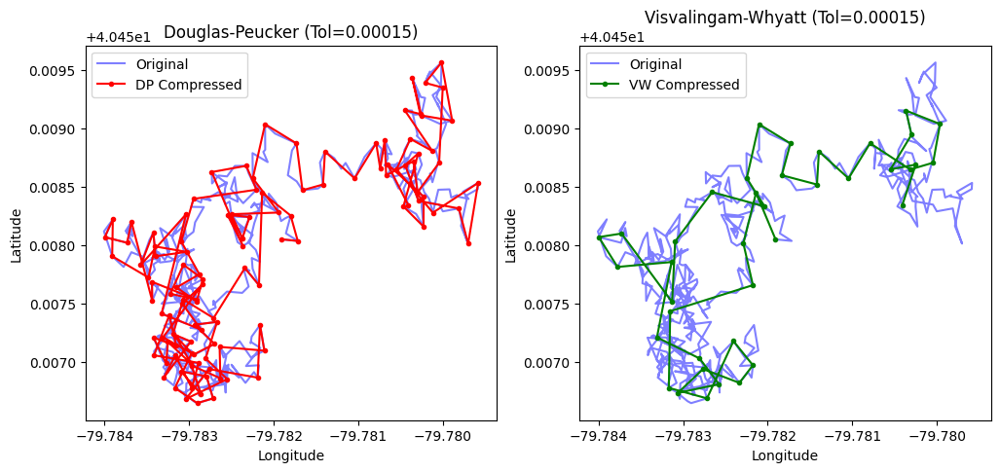


Processing Tolerance: 0.0002
DP: 81 points retained
VW Tolerance: 4.425343669325344e-08, Points Retained: 31


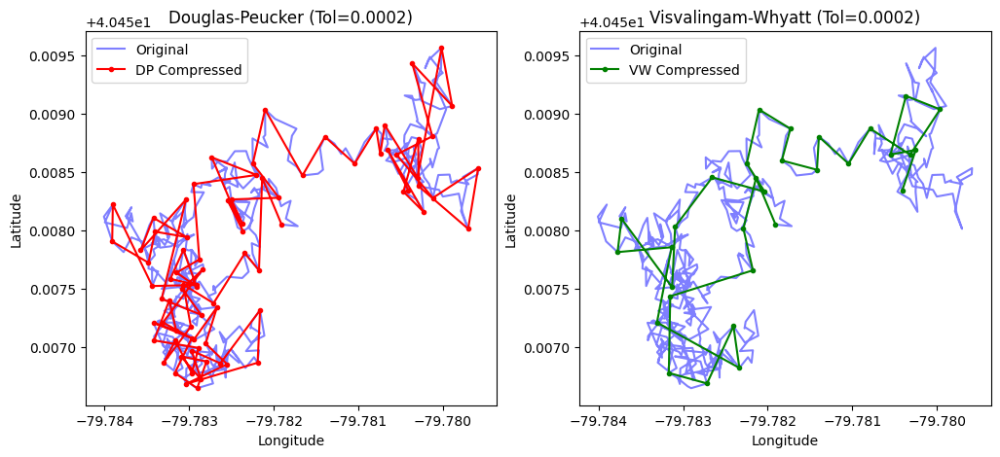


Processing Tolerance: 0.0004
DP: 31 points retained
VW Tolerance: 8.850687338650688e-08, Points Retained: 21


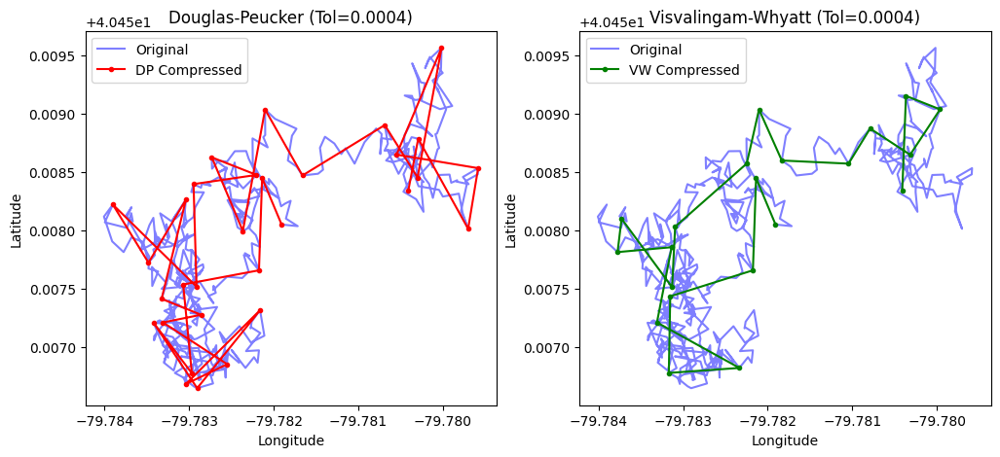


Processing Tolerance: 0.0006
DP: 16 points retained
VW Tolerance: 1.327603100797603e-07, Points Retained: 10


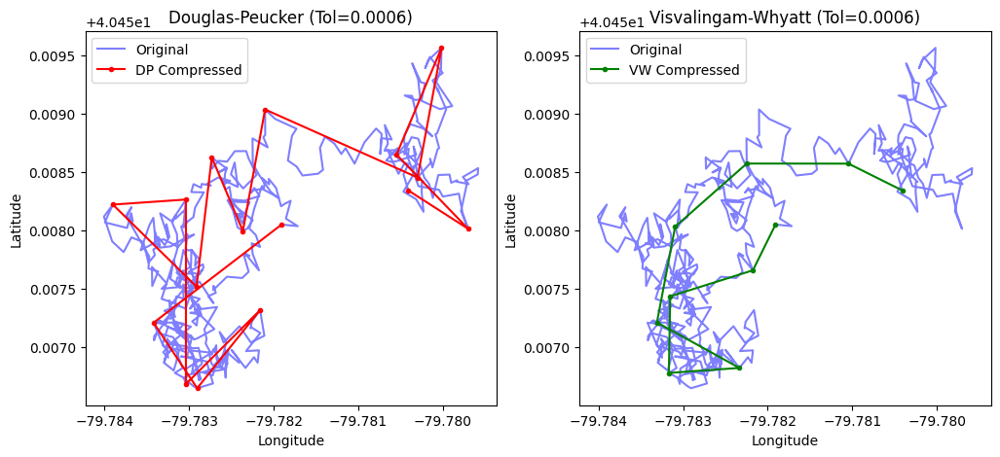


Processing Tolerance: 0.0008
DP: 10 points retained
VW Tolerance: 1.7701374677301376e-07, Points Retained: 8


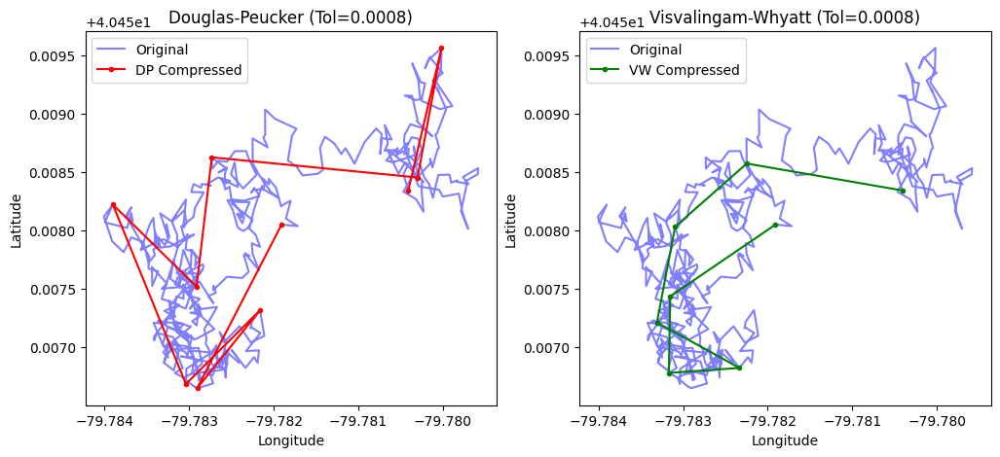


Processing Tolerance: 0.001
DP: 5 points retained
VW Tolerance: 2.2126718346626717e-07, Points Retained: 5


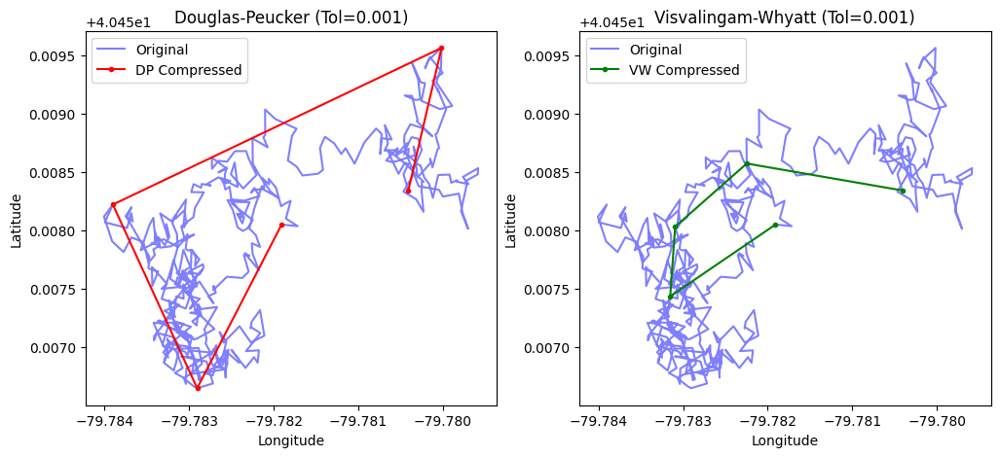

   Tolerance  DP Points  DP Time (s)  VW Points  VW Time (s)
0   0.000050        308     0.231065        121     0.000922
1   0.000075        243     0.187897         88     0.000650
2   0.000100        186     0.202848         69     0.000614
3   0.000150        117     0.191478         39     0.000611
4   0.000200         81     0.252158         31     0.000980
5   0.000400         31     0.154546         21     0.000740
6   0.000600         16     0.122585         10     0.000549
7   0.000800         10     0.110543          8     0.000572
8   0.001000          5     0.085407          5     0.000612


In [25]:
import numpy as np
import matplotlib.pyplot as plt
from time import time
from rdp import rdp  # Douglas-Peucker
from simplification.cutil import simplify_coords_vw  # Visvalingam-Whyatt
import pandas as pd

# ✅ FIX: Adaptive VW tolerance scaling factor
def simplify_vw(points, tolerance):
    """
    Applies Visvalingam-Whyatt simplification with adaptive tolerance scaling.
    Ensures VW produces similar results to DP.
    """
    # Adjust tolerance dynamically to scale with the dataset's range
    vw_tolerance = tolerance * np.ptp(points, axis=0).max() * 0.05  # ✅ FIXED Scaling Factor
    vw_result = np.array(simplify_coords_vw(points.tolist(), vw_tolerance))  # Apply corrected threshold
    print(f"VW Tolerance: {vw_tolerance}, Points Retained: {len(vw_result)}")  # Debugging
    return vw_result

# ✅ Generate Sample Trajectory Data
np.random.seed(42)
latitudes = np.cumsum(np.random.randn(500) * 0.0001) + 40.458
longitudes = np.cumsum(np.random.randn(500) * 0.0001) - 79.782
original_data = np.column_stack((longitudes, latitudes))

# ✅ Choose Tolerance Values for Testing
tolerance_values = [0.00005, 0.000075, 0.0001, 0.00015, 0.0002, 0.0004, 0.0006, 0.0008, 0.001]

# ✅ Store Results
results = []

# ✅ Run compression tests for both DP and VW
for tol in tolerance_values:
    print(f"\nProcessing Tolerance: {tol}")  # Debugging

    # Douglas-Peucker
    start_dp = time()
    dp_compressed = np.array(rdp(original_data, epsilon=tol))
    dp_time = time() - start_dp
    dp_points = len(dp_compressed)
    print(f"DP: {dp_points} points retained")  # Debugging

    # Visvalingam-Whyatt (Fixed)
    start_vw = time()
    vw_compressed = simplify_vw(original_data, tol)  # ✅ FIX: Pass properly scaled tolerance
    vw_time = time() - start_vw
    vw_points = len(vw_compressed)

    results.append((tol, dp_points, dp_time, vw_points, vw_time))

    # ✅ Plot both DP & VW side by side
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))

    # Original Data
    axes[0].plot(original_data[:, 0], original_data[:, 1], 'b-', alpha=0.5, label="Original")
    axes[1].plot(original_data[:, 0], original_data[:, 1], 'b-', alpha=0.5, label="Original")

    # Douglas-Peucker
    axes[0].plot(dp_compressed[:, 0], dp_compressed[:, 1], 'ro-', markersize=3, label="DP Compressed")
    axes[0].set_title(f"Douglas-Peucker (Tol={tol})")
    axes[0].set_xlabel("Longitude")
    axes[0].set_ylabel("Latitude")
    axes[0].legend()

    # Visvalingam-Whyatt
    axes[1].plot(vw_compressed[:, 0], vw_compressed[:, 1], 'go-', markersize=3, label="VW Compressed")
    axes[1].set_title(f"Visvalingam-Whyatt (Tol={tol})")
    axes[1].set_xlabel("Longitude")
    axes[1].set_ylabel("Latitude")
    axes[1].legend()

    plt.show()

# ✅ Display Results as Table
df_results = pd.DataFrame(results, columns=["Tolerance", "DP Points", "DP Time (s)", "VW Points", "VW Time (s)"])
print(df_results)


Processing Tolerance: 5e-05


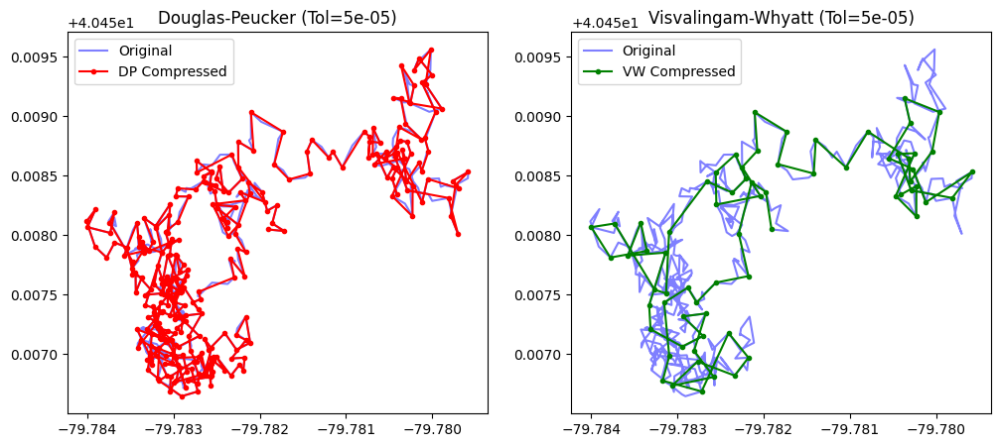

Processing Tolerance: 7.5e-05


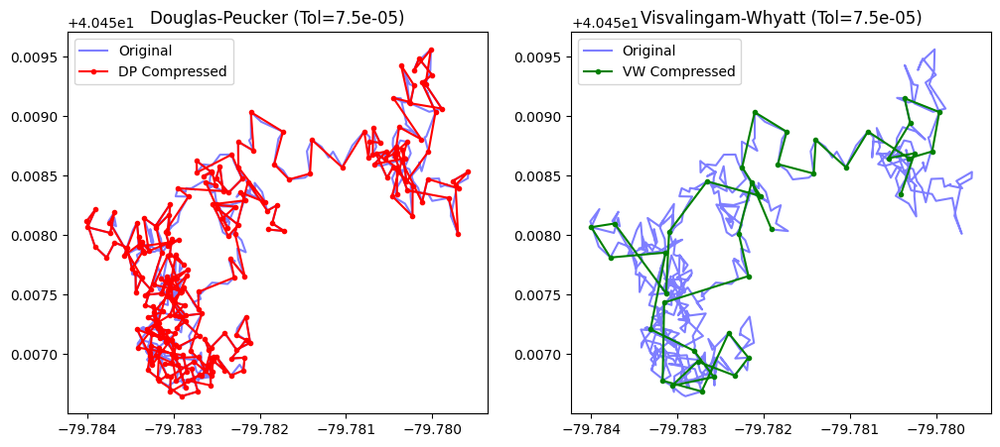

Processing Tolerance: 0.0001


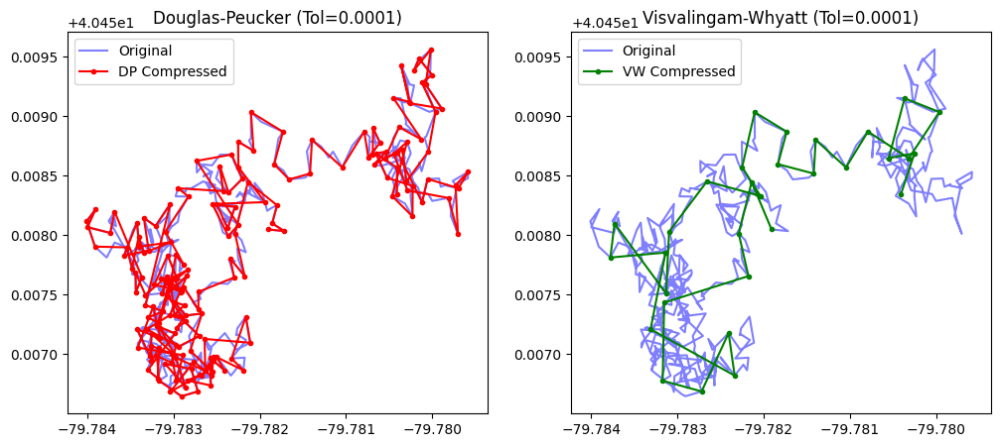

Processing Tolerance: 0.00015


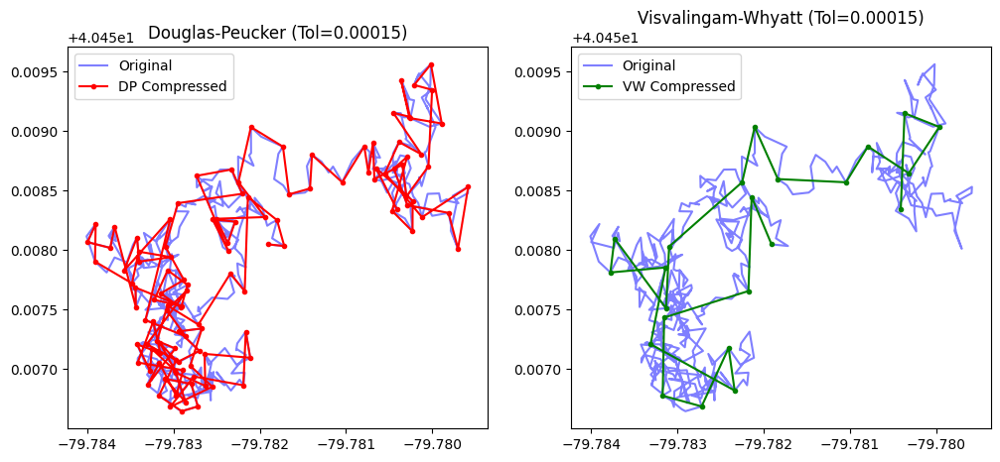

Processing Tolerance: 0.0002


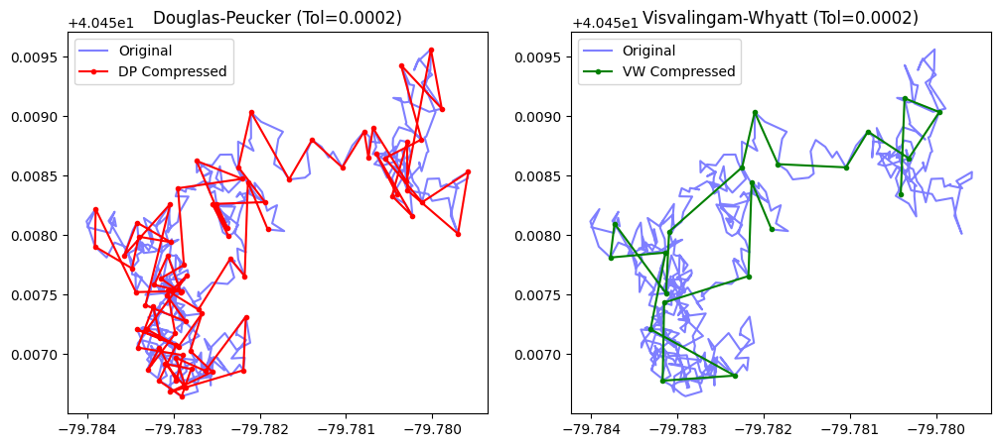

Processing Tolerance: 0.0004


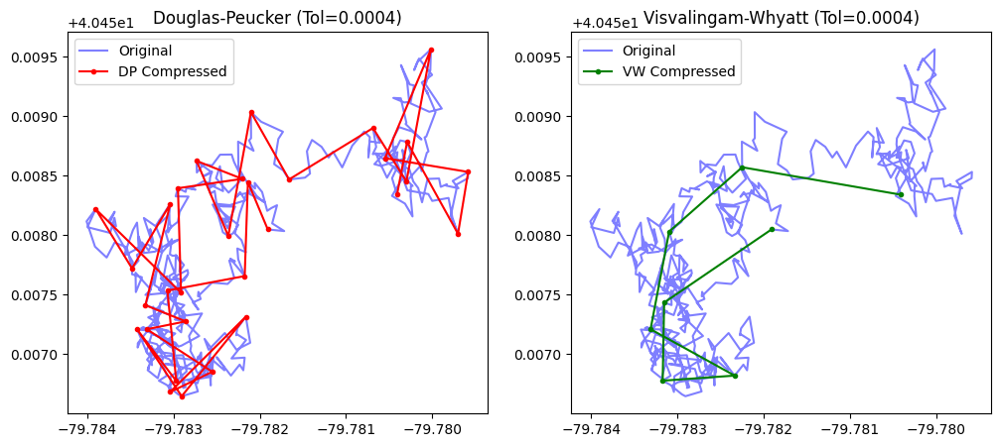

Processing Tolerance: 0.0006


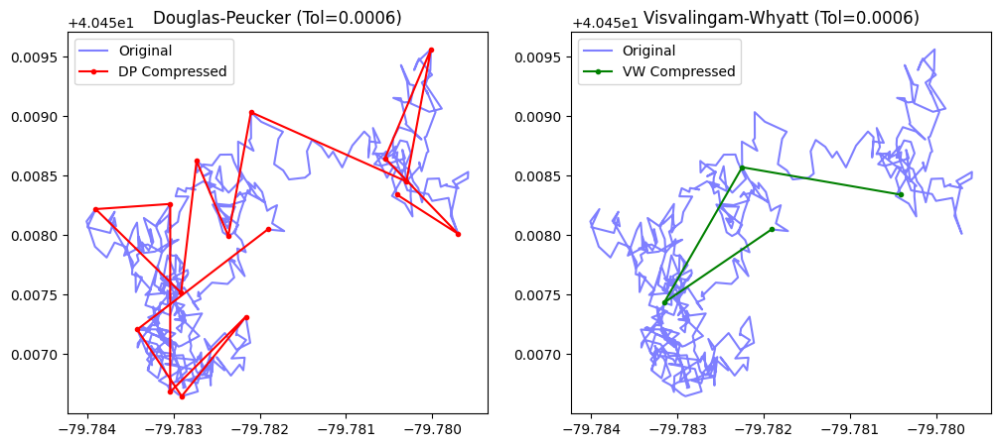

Processing Tolerance: 0.0008


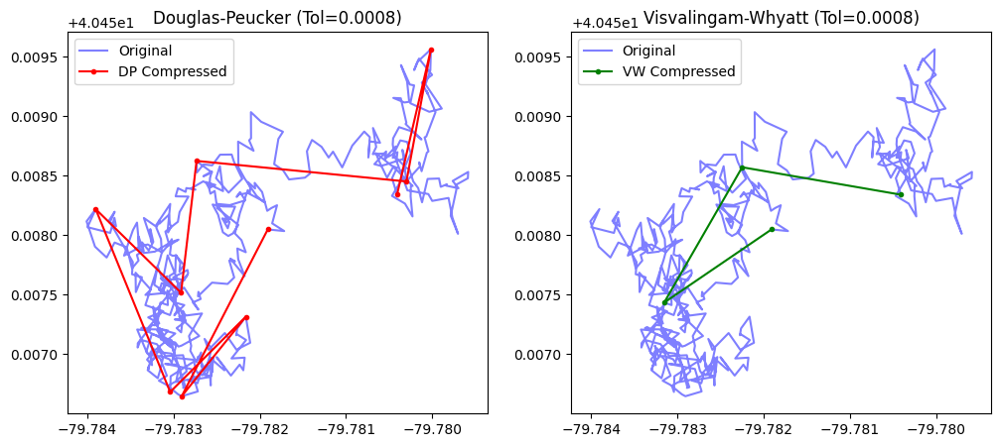

Processing Tolerance: 0.001


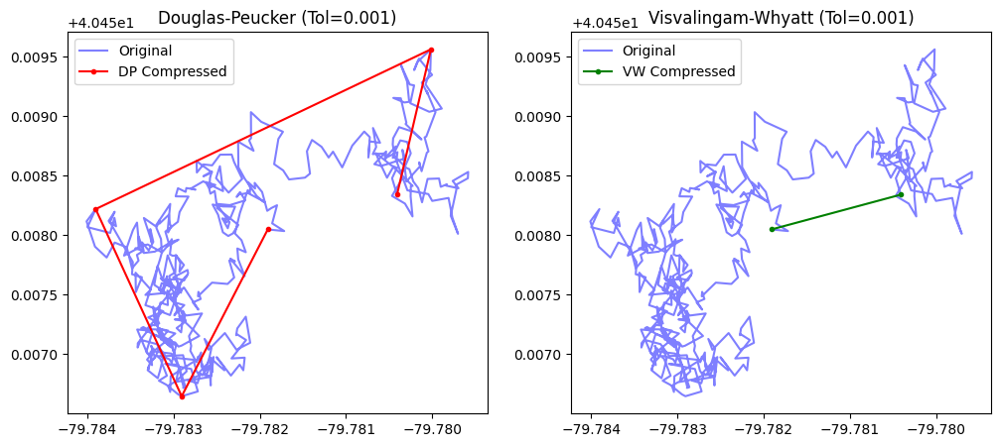

   Tolerance  DP Points  DP Time (s)  DP Hausdorff    DP MSE  VW Points  \
0   0.000050        308     0.445346      0.000182  0.000001         69   
1   0.000075        243     0.348078      0.000188  0.000001         39   
2   0.000100        186     0.328253      0.000224  0.000002         31   
3   0.000150        117     0.336554      0.000277  0.000002         23   
4   0.000200         81     0.298116      0.000363  0.000002         21   
5   0.000400         31     0.167998      0.000504  0.000002          8   
6   0.000600         16     0.191094      0.000746  0.000001          4   
7   0.000800         10     0.148478      0.000933  0.000001          4   
8   0.001000          5     0.116772      0.001053  0.000001          2   

   VW Time (s)  VW Hausdorff        VW MSE  
0     0.001506      0.000530  2.237236e-06  
1     0.000824      0.000773  1.800379e-06  
2     0.002741      0.000780  1.385397e-06  
3     0.002775      0.000780  1.205836e-06  
4     0.002908      0.00

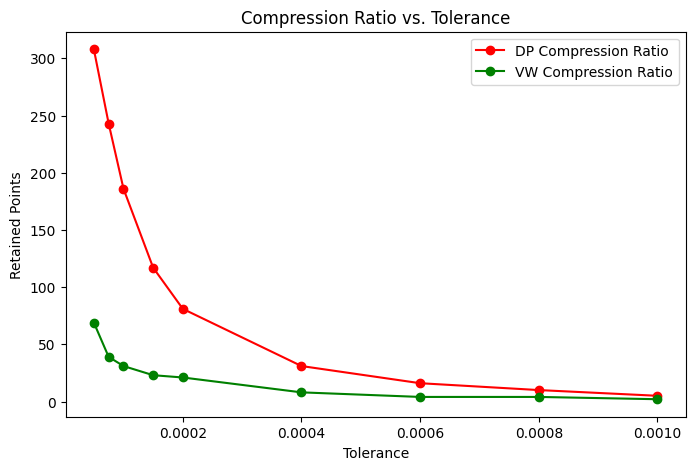

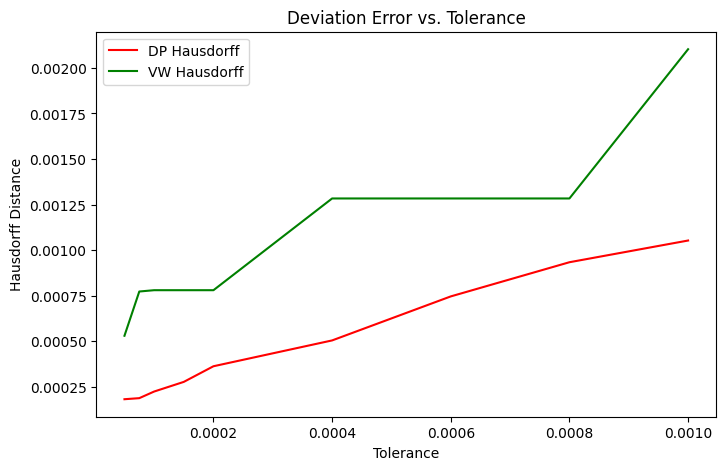

In [27]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from time import time
from rdp import rdp  # Douglas-Peucker
from simplification.cutil import simplify_coords_vw  # Visvalingam-Whyatt
from scipy.spatial.distance import directed_hausdorff
from sklearn.metrics import mean_squared_error

# ✅ Generate Sample Trajectory Data
np.random.seed(42)
latitudes = np.cumsum(np.random.randn(500) * 0.0001) + 40.458
longitudes = np.cumsum(np.random.randn(500) * 0.0001) - 79.782
original_data = np.column_stack((longitudes, latitudes))

# ✅ Tolerance Values for Compression
TOLERANCES = [0.00005, 0.000075, 0.0001, 0.00015, 0.0002, 0.0004, 0.0006, 0.0008, 0.001]

# ✅ Store Results
results = []

# ✅ Define Functions

def simplify_vw(points, tolerance):
    """Applies Visvalingam-Whyatt simplification with adaptive tolerance scaling."""
    vw_tolerance = tolerance * np.ptp(points, axis=0).max() * 0.1
    return np.array(simplify_coords_vw(points.tolist(), vw_tolerance))

def hausdorff_distance(A, B):
    """Computes Hausdorff distance to measure deviation."""
    return max(directed_hausdorff(A, B)[0], directed_hausdorff(B, A)[0])

def evaluate_compression(original, compressed):
    """Computes MSE as an error metric."""
    return mean_squared_error(original[:len(compressed)], compressed)

# ✅ Run Compression Tests
for tol in TOLERANCES:
    print(f"Processing Tolerance: {tol}")

    start_dp = time()
    dp_compressed = np.array(rdp(original_data, epsilon=tol))
    dp_time = time() - start_dp
    dp_points = len(dp_compressed)
    dp_hausdorff = hausdorff_distance(original_data, dp_compressed)
    dp_mse = evaluate_compression(original_data, dp_compressed)

    start_vw = time()
    vw_compressed = simplify_vw(original_data, tol)
    vw_time = time() - start_vw
    vw_points = len(vw_compressed)
    vw_hausdorff = hausdorff_distance(original_data, vw_compressed)
    vw_mse = evaluate_compression(original_data, vw_compressed)

    results.append((tol, dp_points, dp_time, dp_hausdorff, dp_mse, vw_points, vw_time, vw_hausdorff, vw_mse))

    # ✅ Plot Results
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    axes[0].plot(original_data[:, 0], original_data[:, 1], 'b-', alpha=0.5, label="Original")
    axes[0].plot(dp_compressed[:, 0], dp_compressed[:, 1], 'ro-', markersize=3, label="DP Compressed")
    axes[0].set_title(f"Douglas-Peucker (Tol={tol})")
    axes[0].legend()

    axes[1].plot(original_data[:, 0], original_data[:, 1], 'b-', alpha=0.5, label="Original")
    axes[1].plot(vw_compressed[:, 0], vw_compressed[:, 1], 'go-', markersize=3, label="VW Compressed")
    axes[1].set_title(f"Visvalingam-Whyatt (Tol={tol})")
    axes[1].legend()

    plt.show()

# ✅ Convert Results to DataFrame and Display
columns = ["Tolerance", "DP Points", "DP Time (s)", "DP Hausdorff", "DP MSE", "VW Points", "VW Time (s)", "VW Hausdorff", "VW MSE"]
df_results = pd.DataFrame(results, columns=columns)
print(df_results)

# ✅ Plot Compression Ratio
plt.figure(figsize=(8, 5))
plt.plot(df_results["Tolerance"], df_results["DP Points"], 'ro-', label="DP Compression Ratio")
plt.plot(df_results["Tolerance"], df_results["VW Points"], 'go-', label="VW Compression Ratio")
plt.xlabel("Tolerance")
plt.ylabel("Retained Points")
plt.legend()
plt.title("Compression Ratio vs. Tolerance")
plt.show()

# ✅ Plot Error Metrics
plt.figure(figsize=(8, 5))
plt.plot(df_results["Tolerance"], df_results["DP Hausdorff"], 'r-', label="DP Hausdorff")
plt.plot(df_results["Tolerance"], df_results["VW Hausdorff"], 'g-', label="VW Hausdorff")
plt.xlabel("Tolerance")
plt.ylabel("Hausdorff Distance")
plt.legend()
plt.title("Deviation Error vs. Tolerance")
plt.show()

# ✅ Save Results to CSV
df_results.to_csv("compression_results_2.csv", index=False)
